In [453]:
''' statements to import libraries'''
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from IPython.display import display, HTML
from scipy.stats import kurtosis
from pandas.api.types import CategoricalDtype



In [454]:
'''statements to add csv files, remove duplicates etc
'''
#White wine
white_df = pd.read_csv('wine+quality/winequality-white.csv', sep= ';')
white_copy = white_df.copy()
white_copy.columns = white_copy.columns.str.replace(' ', '_')
white_copy = white_copy.drop_duplicates()
if 'colour' not in white_copy.columns:
    white_copy['colour'] = 'white'
else:
    pass

#Red wine
red_df = pd.read_csv('wine+quality/winequality-red.csv', sep = ';')
red_copy = red_df.copy()
if 'colour' not in red_copy.columns:
    red_copy['colour'] = 'red'
else:pass
red_copy.columns = red_copy.columns.str.replace(' ', '_')
red_copy = red_copy.drop_duplicates()
display(red_copy.head())

white_red_df = pd.concat([white_copy, red_copy])


,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol,quality,colour
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5,red
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5,red
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5,red
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6,red
5,7.4,0.66,0.00,1.8,0.075,13.0,40.0,0.9978,3.51,0.56,9.4,5,red


In [455]:
''' add new column to wine_quality'''
if 'quality_label' not in white_copy.columns:
    white_copy['quality_label'] = white_copy.quality.apply(lambda value: 'low' if value <= 5 else 'medium' if value >= 7 else 'high')
else:
    pass


if 'quality_label' not in red_copy.columns:
    red_copy['quality_label'] = red_copy.quality.apply(lambda value: 'low' if value <= 5 else 'medium' if value >= 7 else 'high')
else:
    pass

if 'quality_label' not in white_red_df.columns:
    white_red_df['quality_label'] = white_red_df.quality.apply(lambda value: 'low' if value <= 5 else 'medium' if value >= 7 else 'high')
else:
    pass

In [456]:
'''making Good Medium Bad have a specified order'''
category_order = ['low', 'medium', 'high']
red_copy['quality_label'] = red_copy['quality_label'].astype(CategoricalDtype(categories=category_order, ordered=True))



In [457]:
'''colours and stylings'''
white_color= '#d9c389'
red_color = '#FF7C86'
all_wine_color = '#d0dbff'
background_grey = '#ede6e6'

In [458]:
'''useful when cycling through each dependent varialbe to investigate my independent variable - good medium bad'''
col_lst = ['fixed_acidity', 'volatile_acidity', 'citric_acid', 'residual_sugar',
       'chlorides', 'free_sulfur_dioxide', 'total_sulfur_dioxide', 'density',
       'pH', 'sulphates', 'alcohol', 'quality']

In [459]:
'''lets check how many of each one we have'''
display(red_copy.quality_label.value_counts())
display(white_copy.quality_label.value_counts())


quality_label
low       640
high      535
medium    184
Name: count, dtype: int64

quality_label
high      1788
low       1348
medium     825
Name: count, dtype: int64

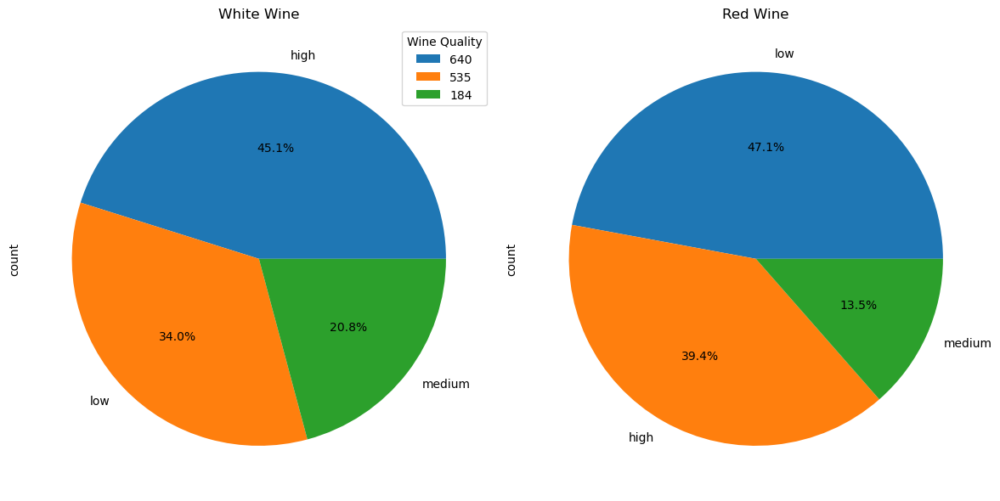

1359


In [460]:
'''wine quality counts - White and Red'''

fig, axs = plt.subplots(1,2, figsize = (12,9))

white_copy.quality_label.value_counts().plot.pie(autopct = '%1.1f%%', ax=axs[0])
axs[0].set_title('White Wine')
axs[0].legend(labels =white_copy.quality_label.value_counts().values, title = 'Wine Quality')
axs[0].set_facecolor(white_color)
red_copy.quality_label.value_counts().plot.pie(autopct = '%1.1f%%', ax=axs[1])
axs[1].set_title('Red Wine')
axs[0].legend(labels =red_copy.quality_label.value_counts().values, title = 'Wine Quality')
axs[1].set_facecolor(red_color)
plt.tight_layout()

plt.show()
print(len(red_copy))


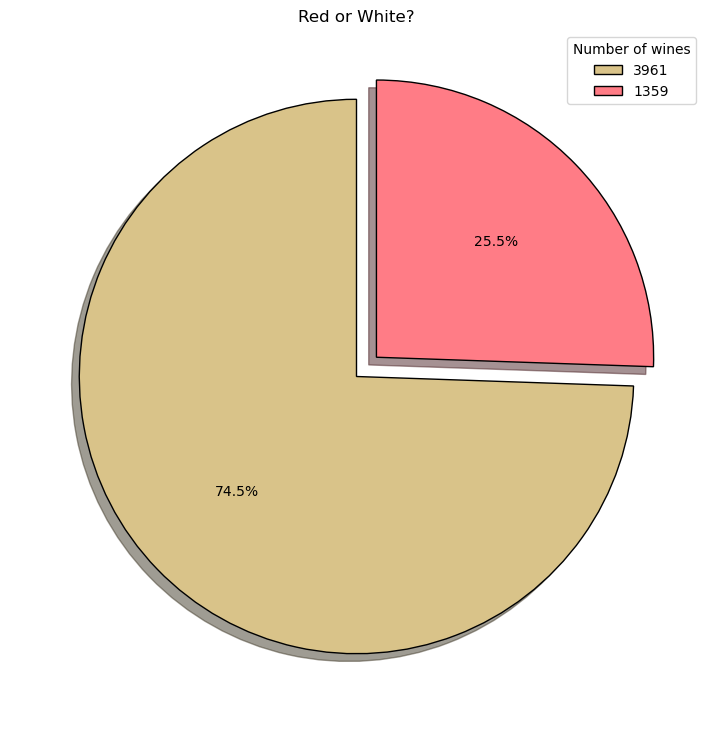

In [461]:
'''pie chart of number of red and white wines'''
fig, axs = plt.subplots(1,1, figsize = (12,9))
explode = (0, 0.1) 
plt.pie(white_red_df.colour.value_counts(),colors=[white_color,red_color], explode= explode, autopct='%1.1f%%', startangle=90, wedgeprops=dict(edgecolor='black'), shadow = True)
plt.legend(labels =white_red_df.colour.value_counts().values, title = 'Number of wines')
plt.title('Red or White?')
plt.show()

/Users/barry/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 1200x900 with 0 Axes>

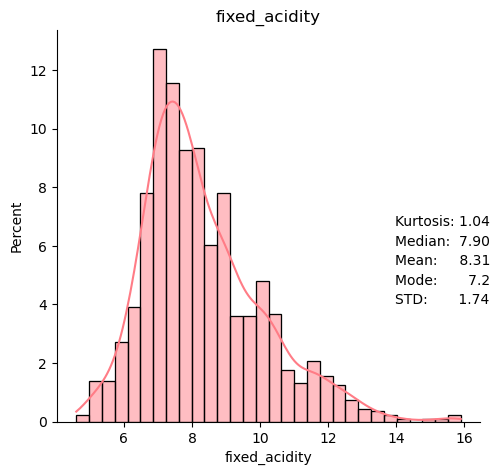

/Users/barry/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 1200x900 with 0 Axes>

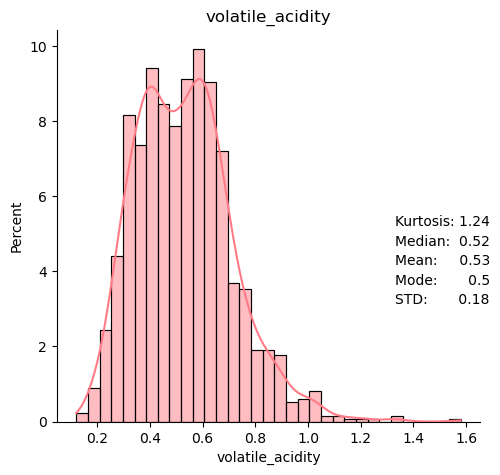

/Users/barry/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 1200x900 with 0 Axes>

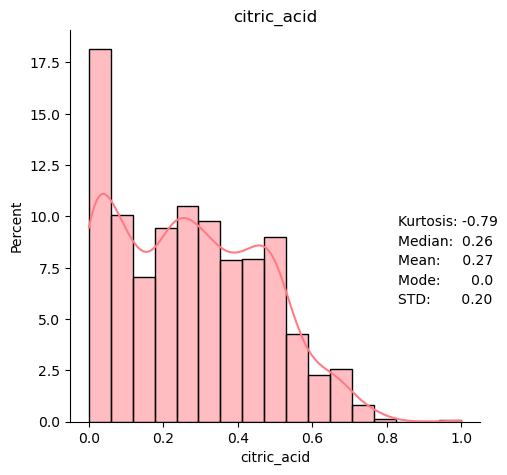

/Users/barry/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 1200x900 with 0 Axes>

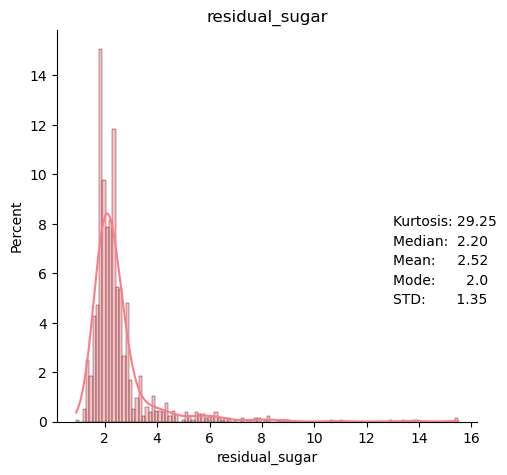

/Users/barry/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 1200x900 with 0 Axes>

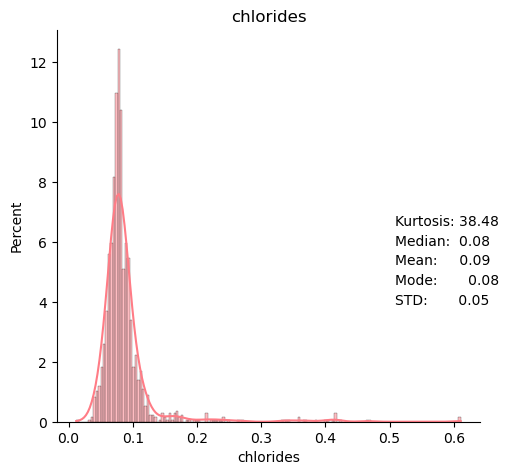

/Users/barry/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 1200x900 with 0 Axes>

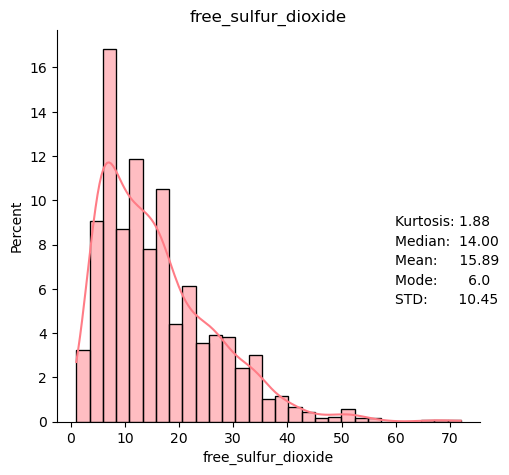

/Users/barry/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 1200x900 with 0 Axes>

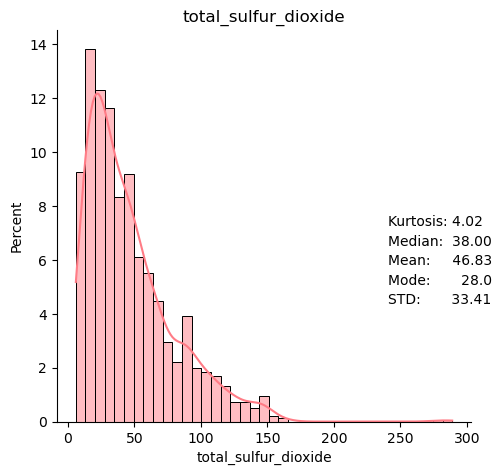

/Users/barry/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 1200x900 with 0 Axes>

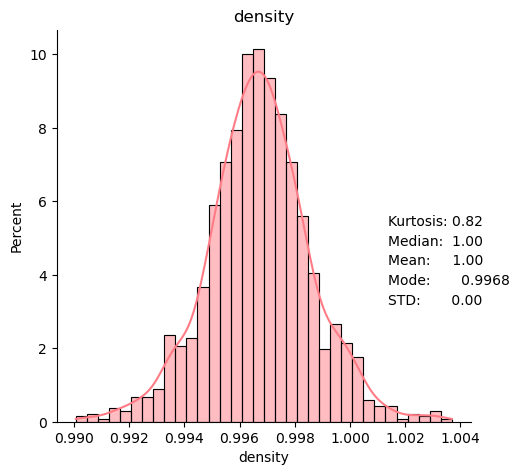

/Users/barry/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 1200x900 with 0 Axes>

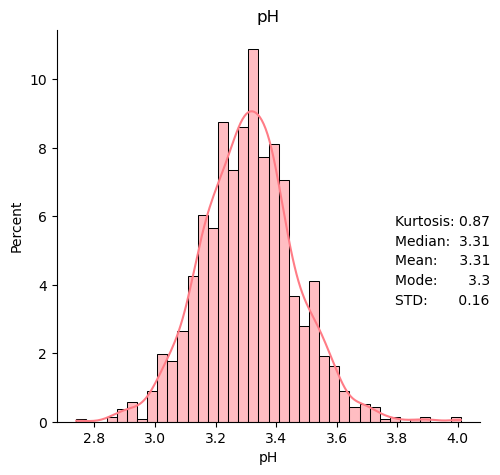

/Users/barry/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 1200x900 with 0 Axes>

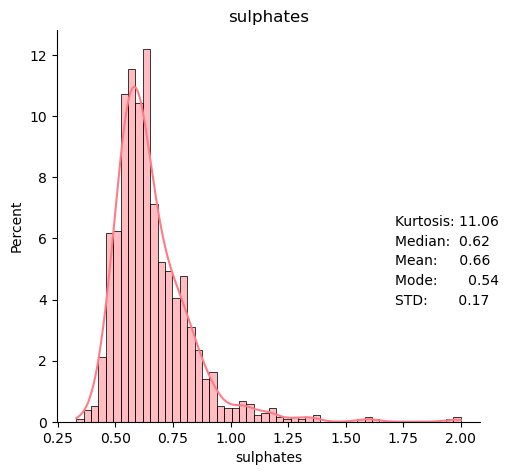

/Users/barry/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 1200x900 with 0 Axes>

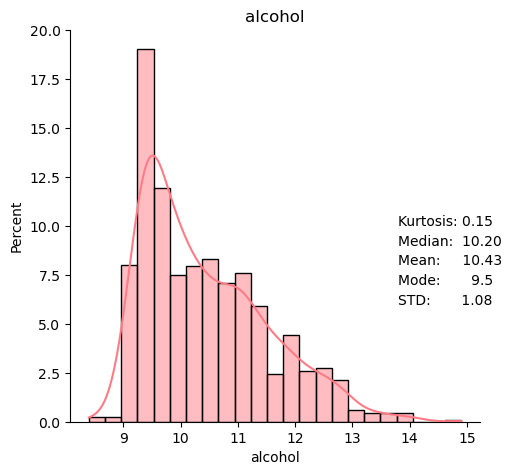

/Users/barry/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 1200x900 with 0 Axes>

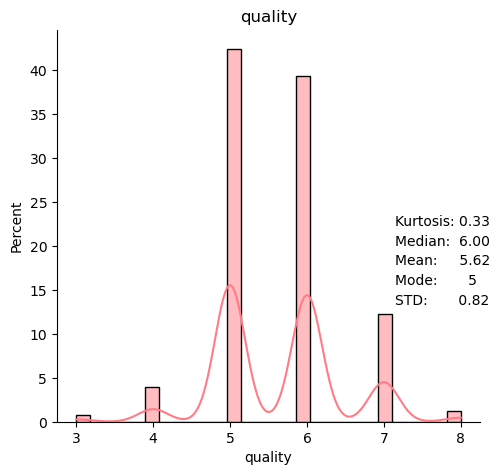

In [462]:
'''plots of each variable to illustrate skewness'''

def dist_plot(df_column_name, colour):
    if colour == 'white':
        color = white_color
    elif colour == 'red':
        color = red_color
    else:
        color = all_wine_color
    plt.figure(figsize= (12,9))

    sns.displot(df_column_name, kde =True, stat = 'percent', color= color)
    kurt = kurtosis(df_column_name)
    mean = df_column_name.mean()
    std = df_column_name.std()
    mode = df_column_name.mode()[0]
    median = df_column_name.median()

    
    plt.text(x=0.8, y=0.5, s=f'Kurtosis: {kurt:.2f}', transform=plt.gca().transAxes, color='black')
    plt.text(x=0.8, y=0.45, s=f'Median:  {median:.2f}', transform=plt.gca().transAxes, color='black')
    plt.text(x=0.8, y=0.4, s=f'Mean:     {mean:.2f}', transform=plt.gca().transAxes, color='black')
    plt.text(x=0.8, y=0.35,s=f'Mode:       {mode}', transform=plt.gca().transAxes, color='black')

    plt.text(x=0.8, y=0.3, s=f'STD:       {std:.2f}', transform=plt.gca().transAxes, color='black')

    plt.title(f'{df_column_name.name}')
    plt.subplots_adjust(top = 0.9)

    plt.show()

for val in col_lst:

    dist_plot(red_copy[val], 'red')
    

In [463]:
def dist_plot_overlay(column_name):
    #plt.ylabel('Frequency - normalised')
    
    fig1 = sns.histplot(white_copy[column_name], kde =True,  color=white_color, stat= 'density', label = 'white_wine')
    plt.gca().set_facecolor('#ede6e6')

    axs[0].set_title(f'White Wine')
    fig2 = sns.histplot(red_copy[column_name], kde = True,  color = red_color, stat= 'density', label = 'red wine')
    axs[1].set_title(f'Red Wine')
    plt.legend()
    plt.show()

for val in col_lst:
    try:
        dist_plot_overlay(white_red_df[val])
    except:
        pass

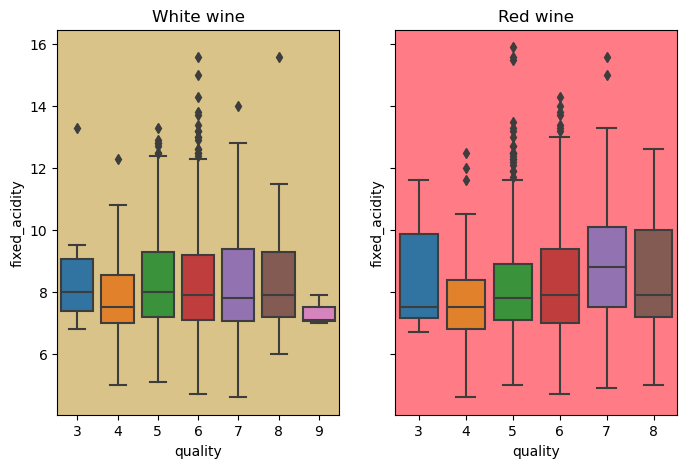

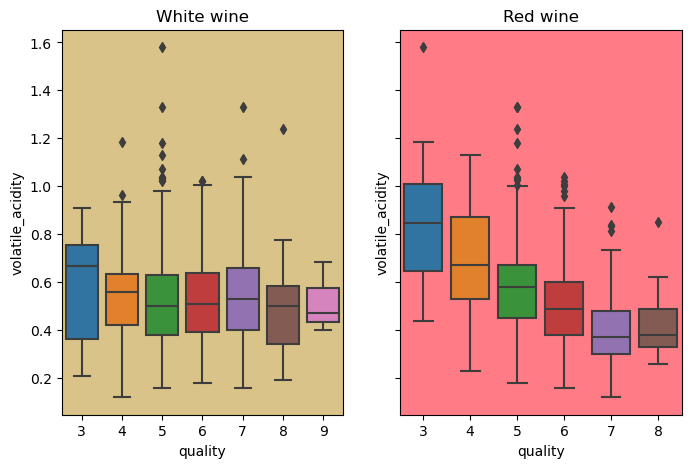

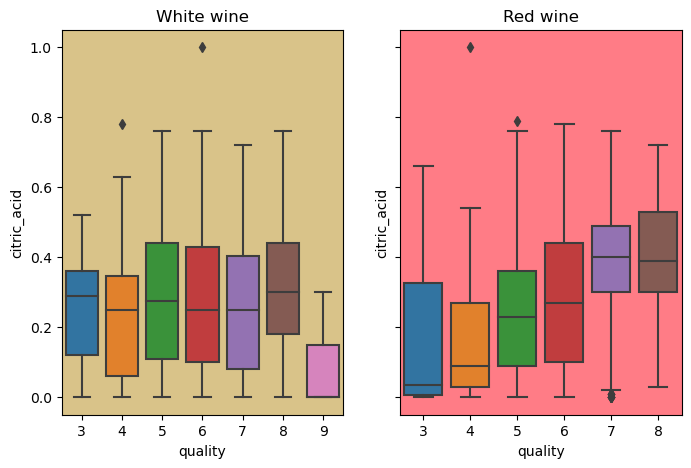

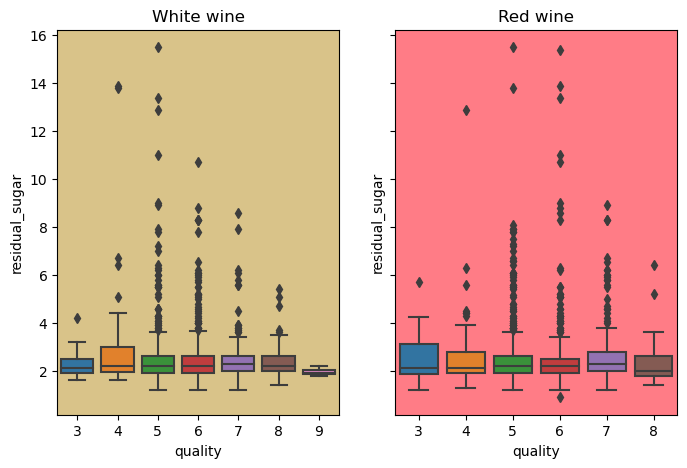

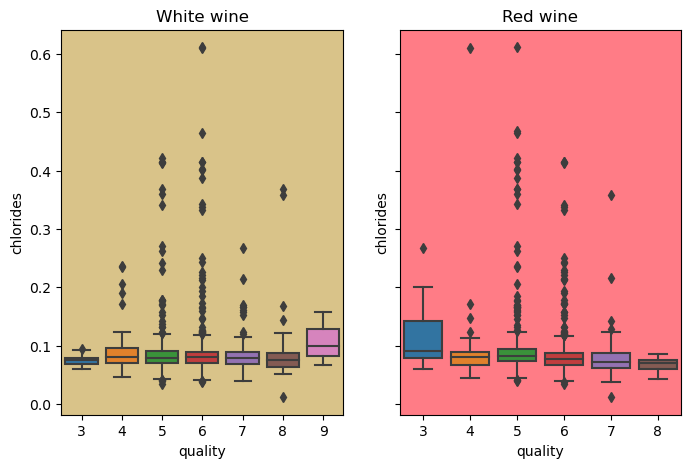

...

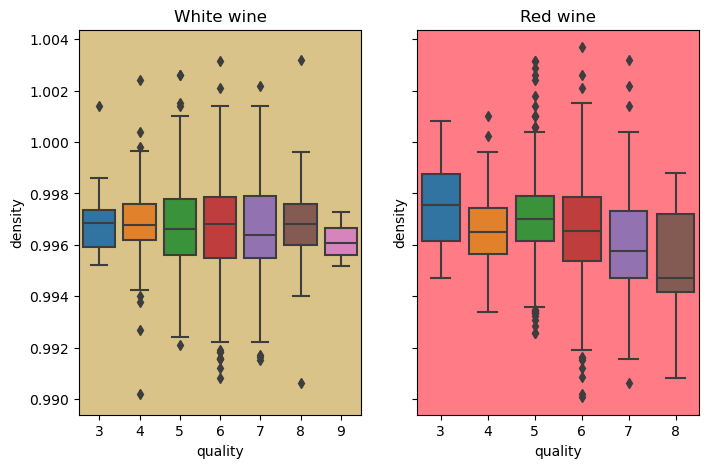

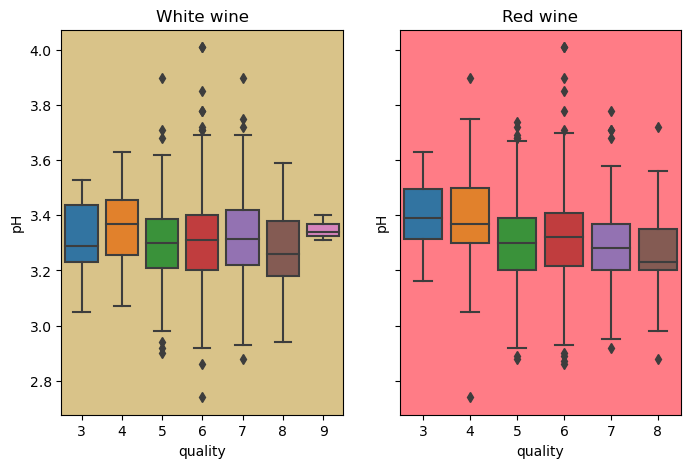

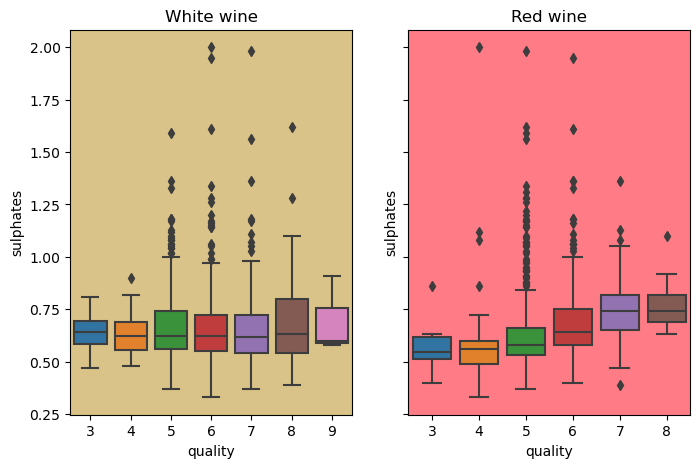

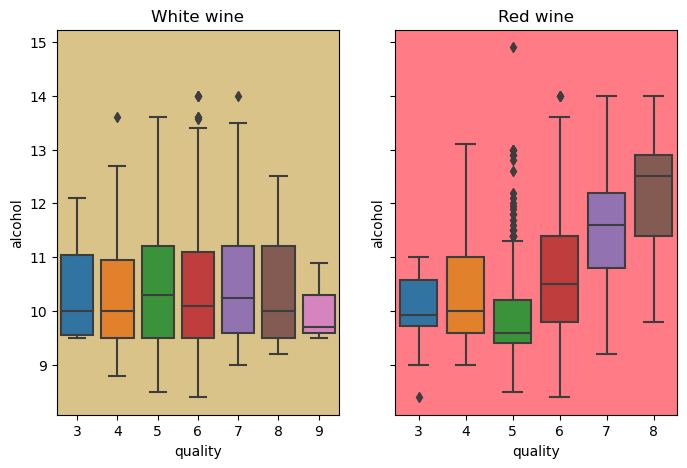

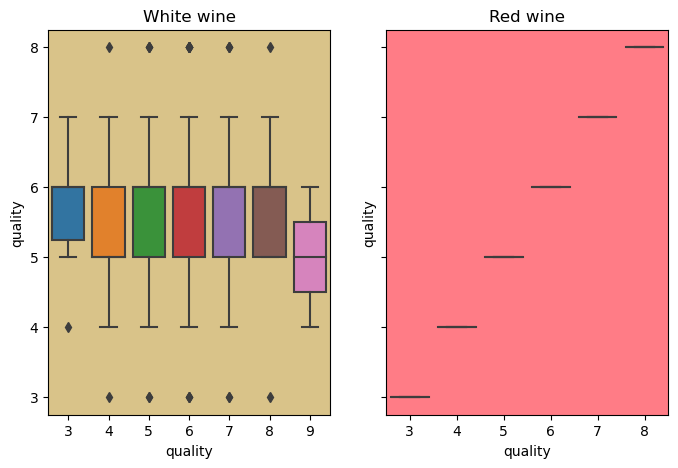

In [464]:
'''generate boxplots contrasting white wine and red wine for each variable'''
def boxplot_generator(df_column1, df_column2):
    fig, axs = plt.subplots(1, 2, figsize=(8, 5), sharey= True)
    fig1 = sns.boxplot(x= df_column1, y= df_column2, ax = axs[1])
    fig2 = sns.boxplot(x= white_copy['quality'], y= df_column2, ax = axs[0])
    axs[0].set_title('White wine')
    axs[0].set_facecolor(white_color)
    axs[1].set_title('Red wine')
    plt.gca().set_facecolor(red_color)

    plt.show()
    
for val in col_lst:
    try:
        boxplot_generator(red_copy['quality'], red_copy[val])
    except:
        pass


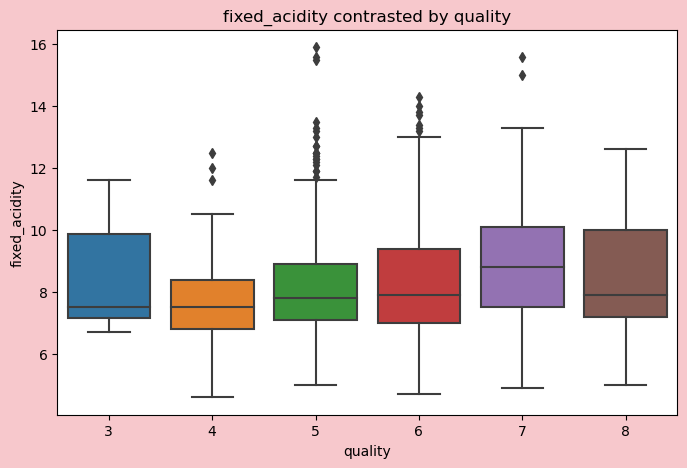

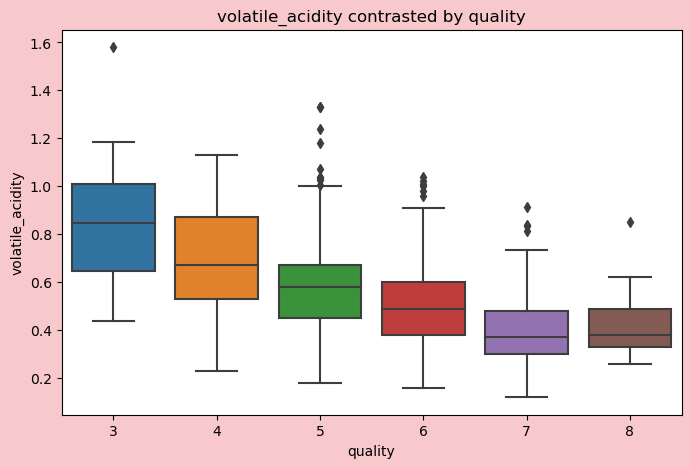

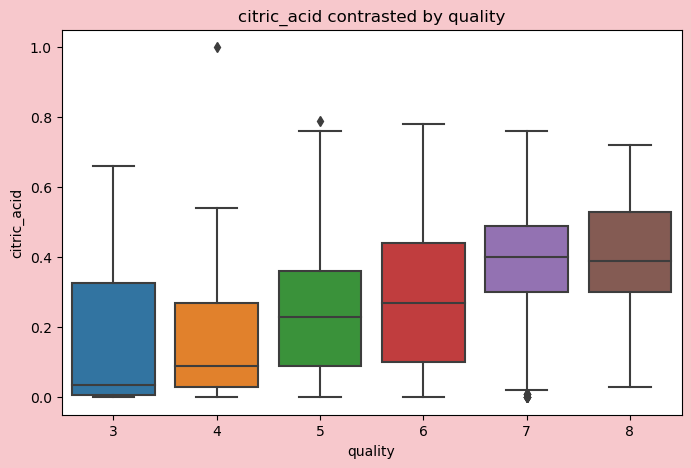

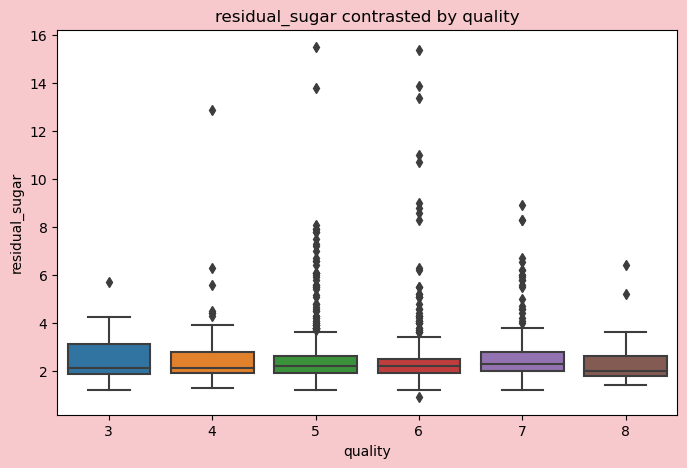

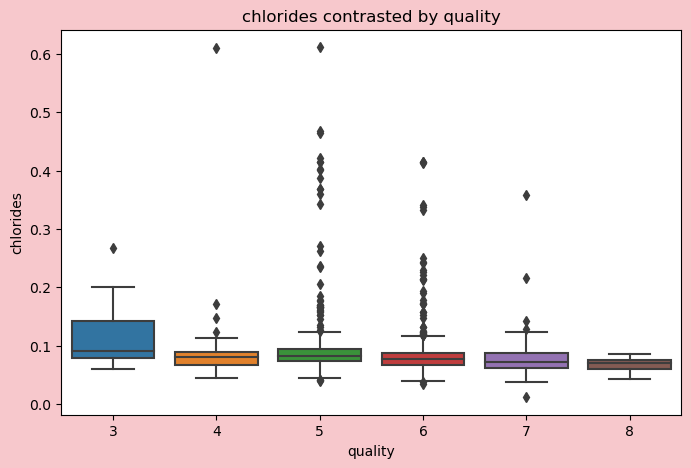

...

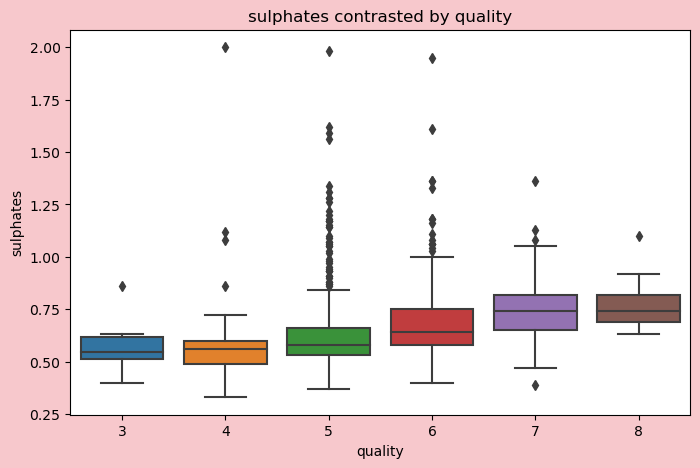

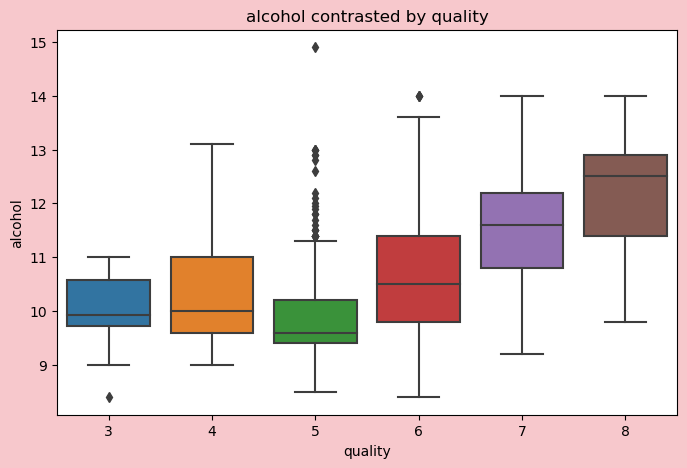

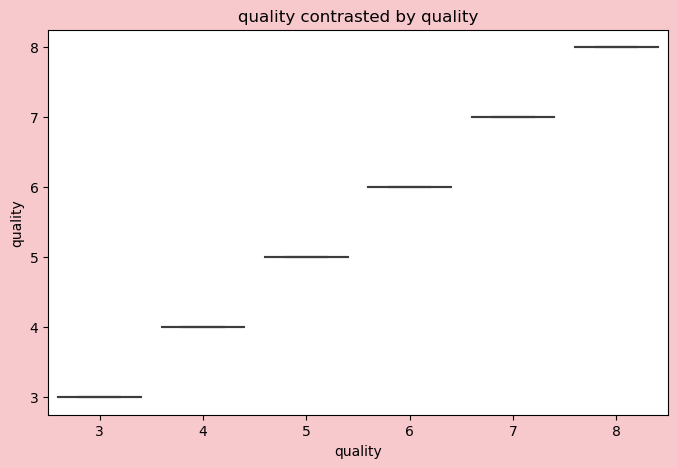

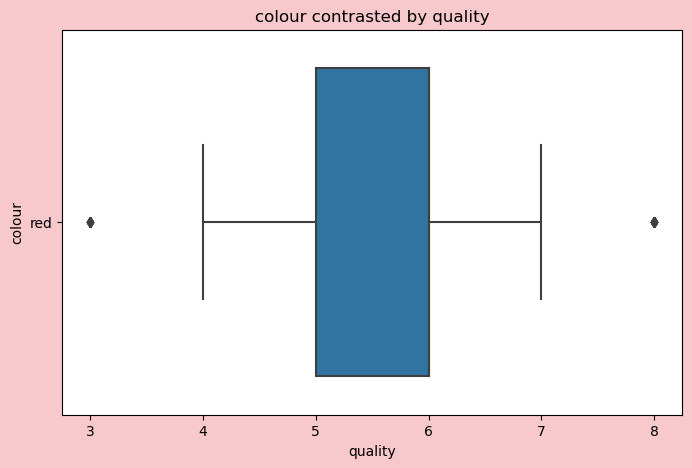

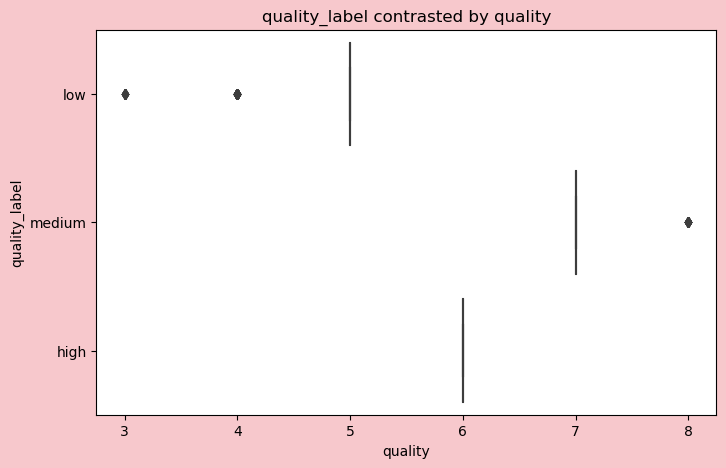

In [465]:
''' creating boxplots for one wine'''
def boxplot_generator2(df_column1, df_column2):
    fig, axs = plt.subplots(1, 1, figsize=(8, 5))
    fig.set_facecolor('#f7c8cc')
    plt.title(f'{df_column2.name} contrasted by quality')
    fig = sns.boxplot(x= df_column1, y= df_column2)
    plt.show()
    
for val in red_copy.columns:
    try:
        boxplot_generator2(red_copy['quality'], red_copy[val])
    except:
        pass

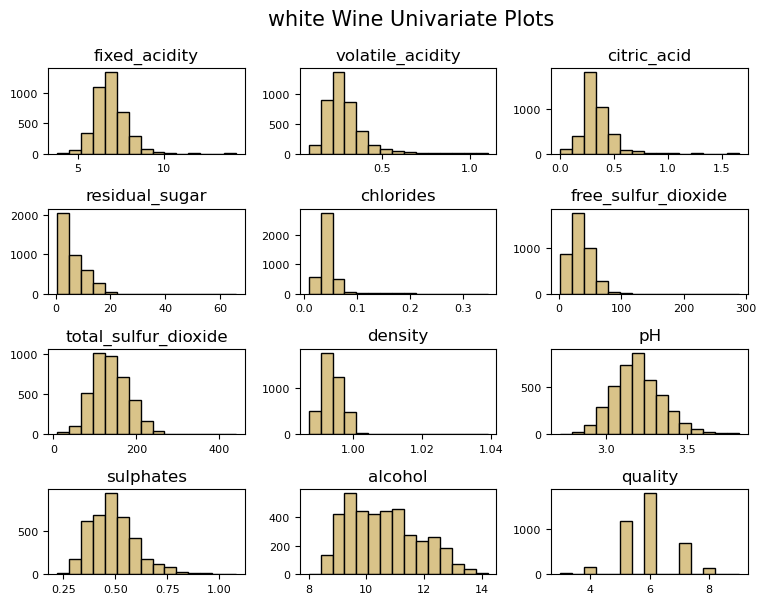

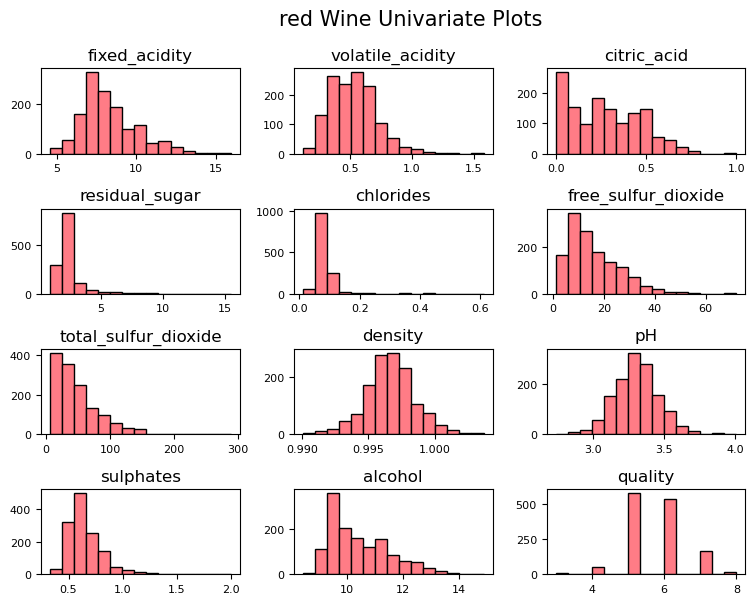

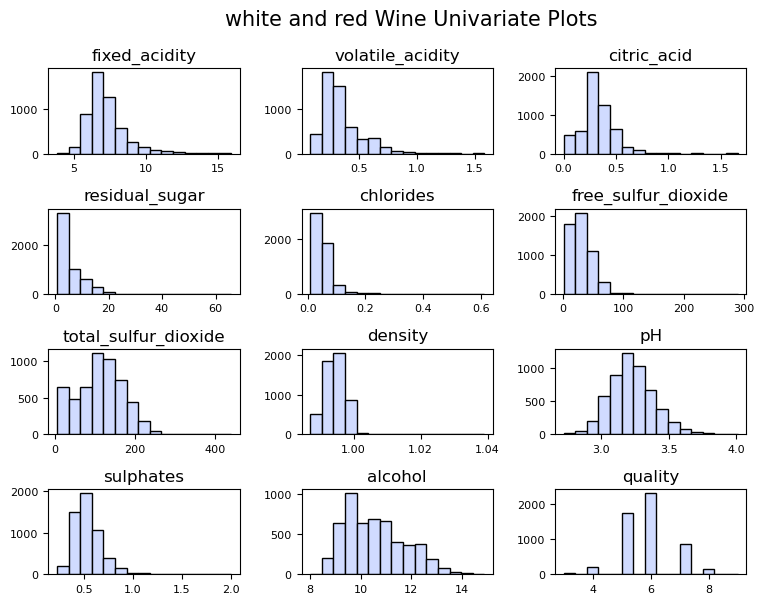

In [466]:
'''Univariate analysis print all the variable histograms on the one plot'''
def univarite_analysis(df, wine_type):
    if df.equals(white_copy):
        color = white_color
    elif df.equals(red_copy):
        color = red_color
    else:
        color = all_wine_color
    
    df.hist(bins=15, color=color, edgecolor='black', linewidth=1.0, xlabelsize=8, ylabelsize=8, grid=False)

    plt.tight_layout(rect=(0, 0, 1.2, 1.2))

    rt = plt.suptitle(f'{wine_type} Wine Univariate Plots', x=0.65, y=1.25, fontsize=15)

#    fig1, ax = plt.subplots()

#     ax = sns.histplot(white_copy[column_name], kde =True,  color=white_color, stat= 'percent', label = 'white_wine')
#     fig1.set_facecolor(background_grey)
#     ax.set_facecolor(background_grey)
#     ax.set_title(f'{column_name} compared between white and red wine')
#     ax.set_ylabel(f'{column_name} shown as a percentage of its count')

#     fig2 = sns.histplot(red_copy[column_name], kde = False,  color = red_color, stat= 'percent', label = 'red wine')
#     plt.legend()
#     plt.show()

univarite_analysis(white_copy, 'white')
univarite_analysis(red_copy, 'red')
univarite_analysis(white_red_df, 'white and red')

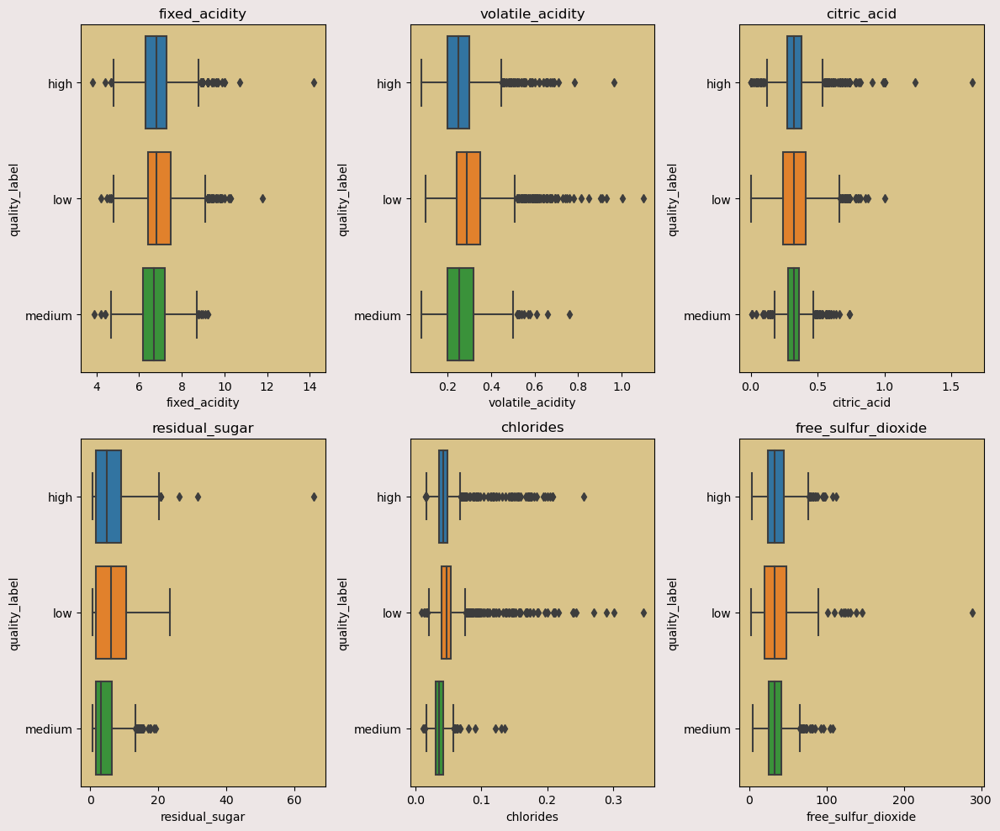

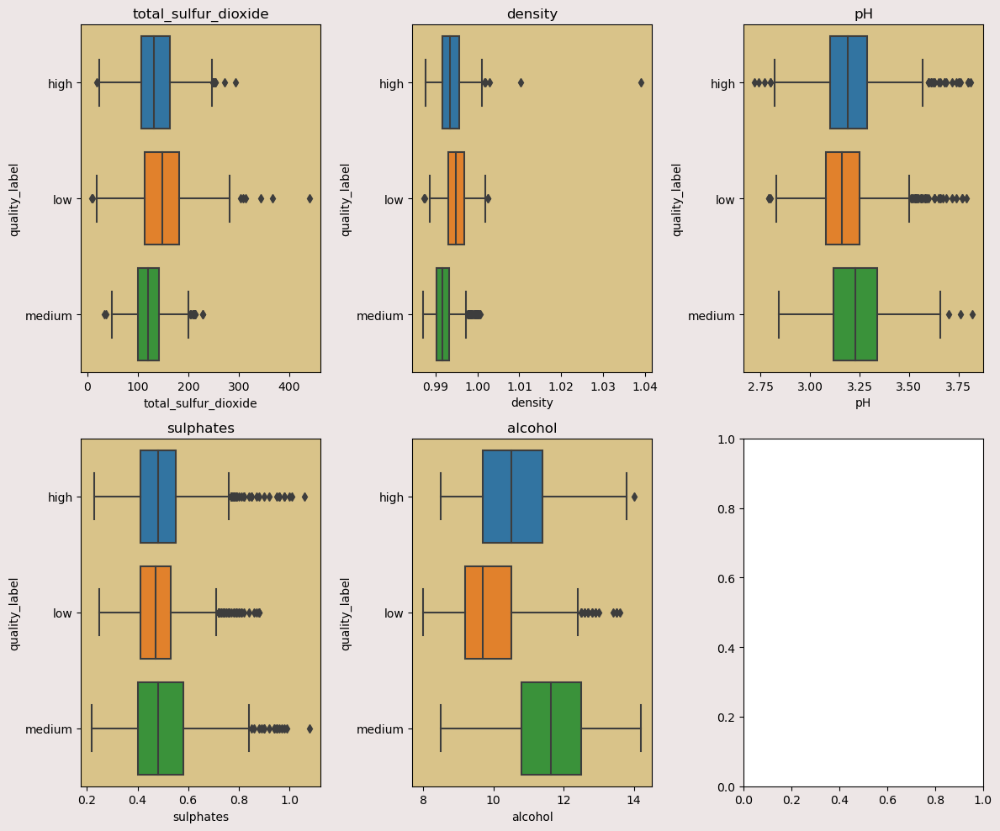

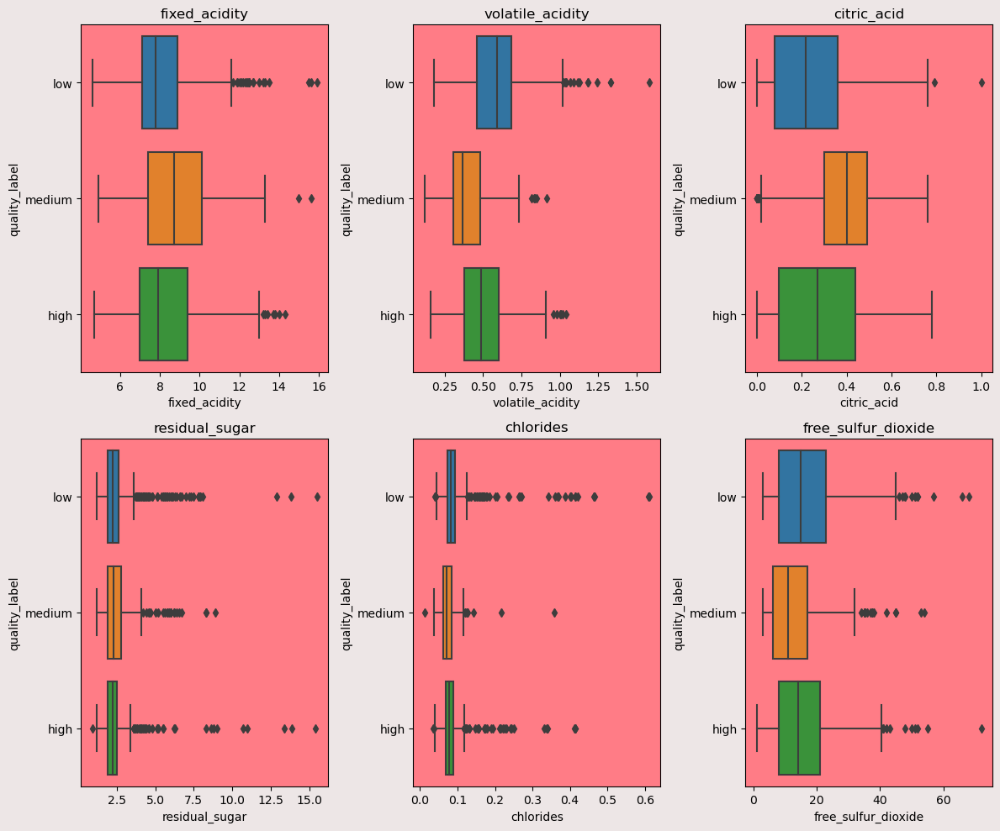

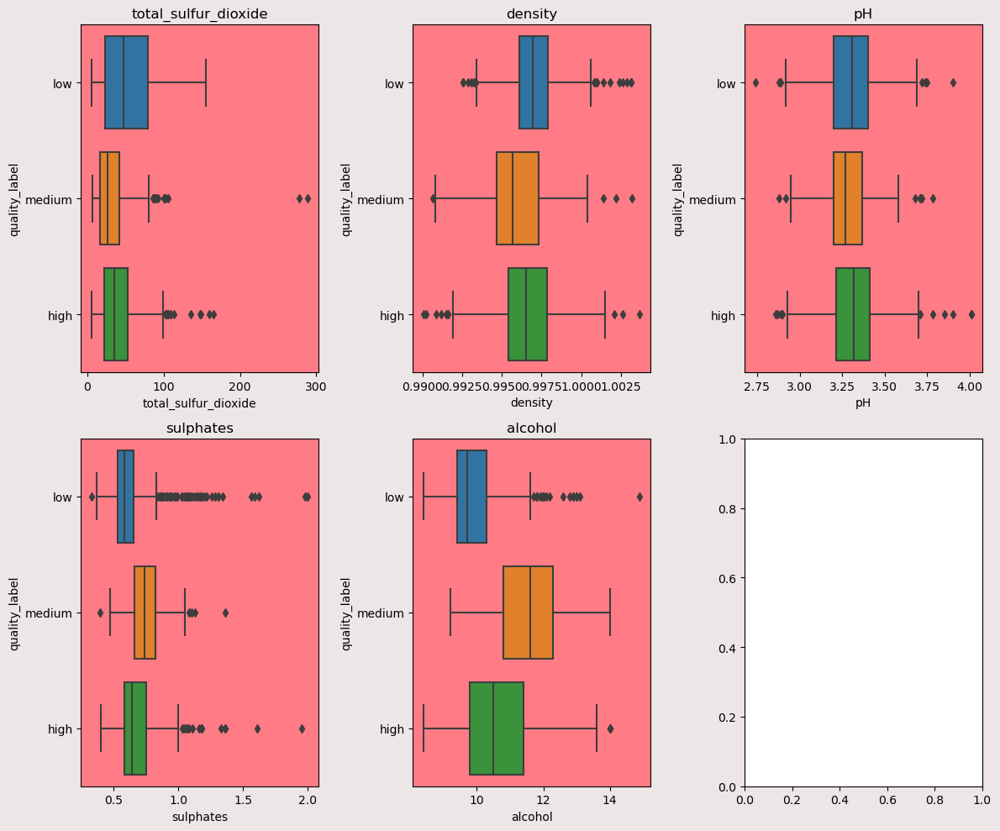

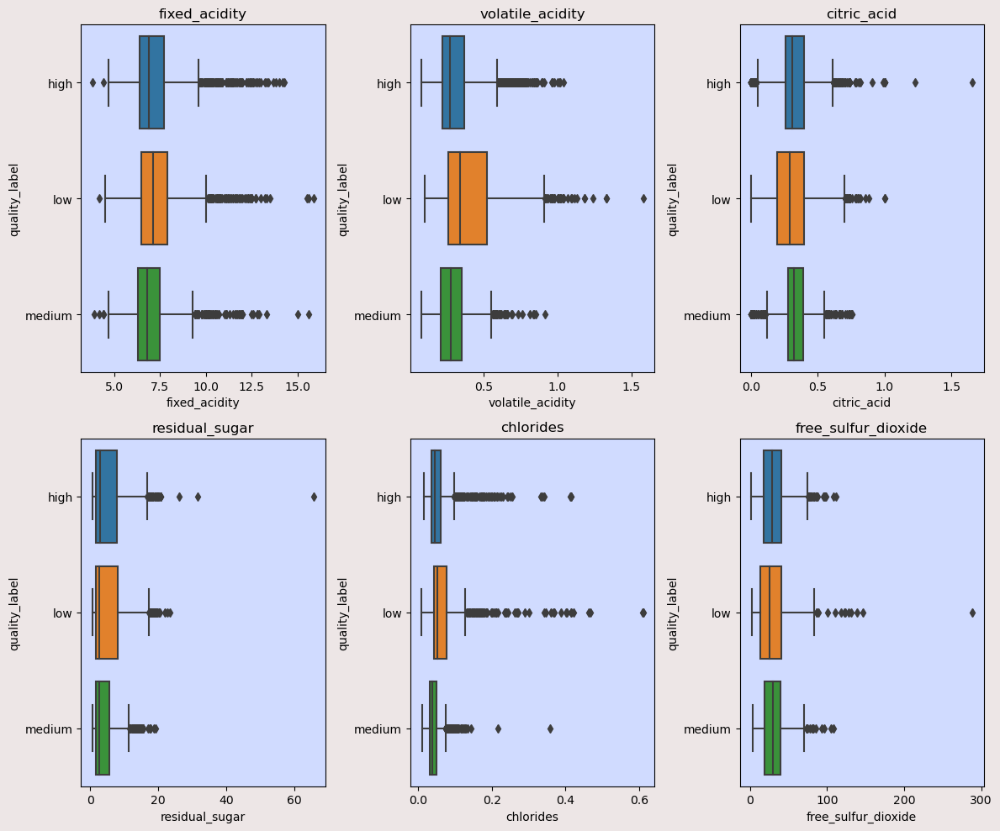

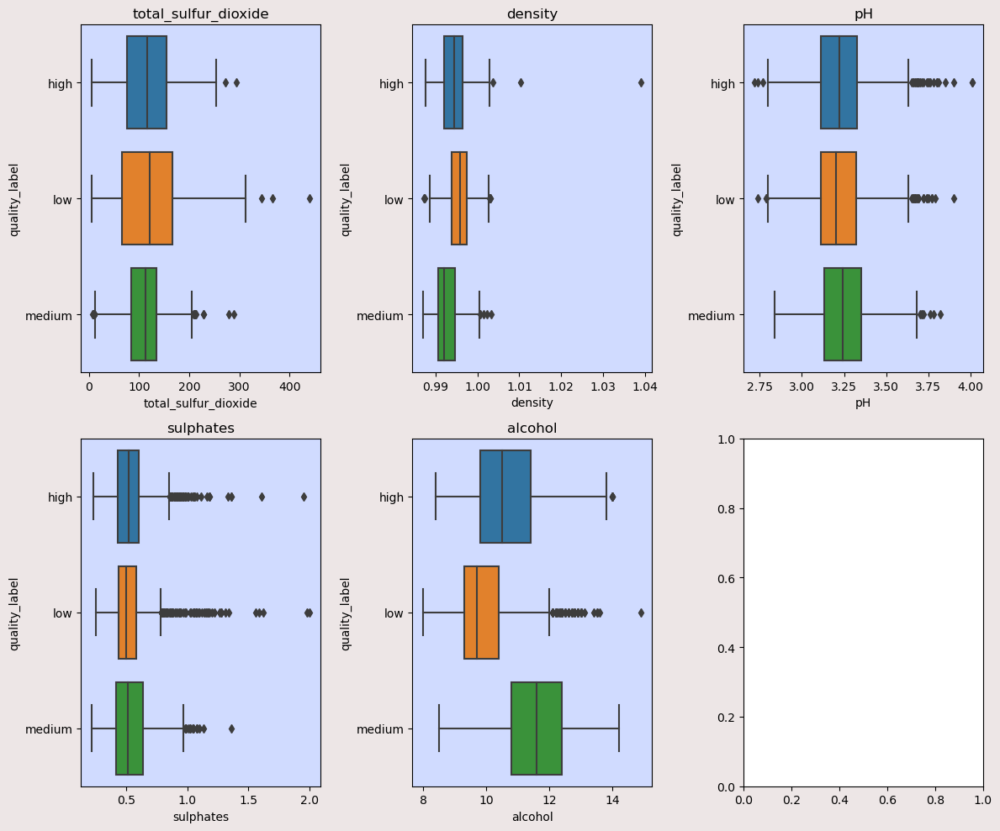

In [467]:
'''generate a grid of boxplots based on each variable contrasted with wine quality. '''

def boxplot_generator3(lst_cols, colour):
    num_cols = len(lst_cols)
    if colour == 'red':
        colour = red_color
        df = red_copy
    elif colour == 'white':
        colour = white_color
        df = white_copy
    else:
        colour = all_wine_color
        df = white_red_df
    num_rows = (num_cols //3) + (num_cols %2)
    fig, axs = plt.subplots(num_rows, 3, figsize = (12, 5 *num_rows))
    fig.set_facecolor(background_grey)
    axs = axs.flatten()
    for i, var_of_i in enumerate(lst_cols):
        ax = axs[i]
        sns.boxplot(x = df[var_of_i], y = df.quality_label, ax = ax)
        
        ax.set_facecolor(colour)
        ax.set_title(f'{var_of_i}')   
    plt.tight_layout()

boxplot_generator3(col_lst[:6], 'white')
boxplot_generator3(col_lst[6:-1], 'white')
boxplot_generator3(col_lst[:6], 'red')
boxplot_generator3(col_lst[6:-1], 'red')
boxplot_generator3(col_lst[:6], 'skip')
boxplot_generator3(col_lst[6:-1], 'skip')




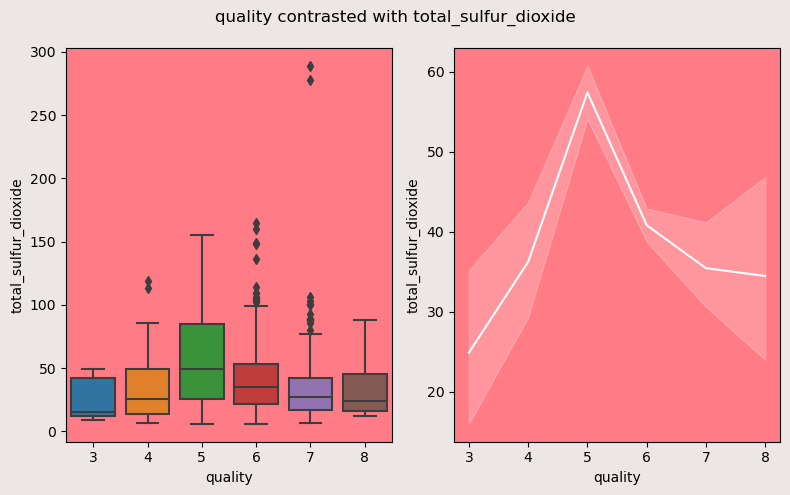

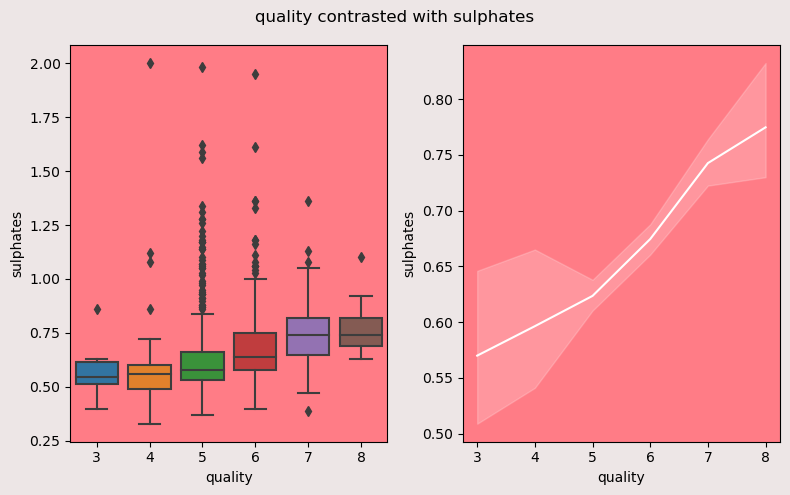

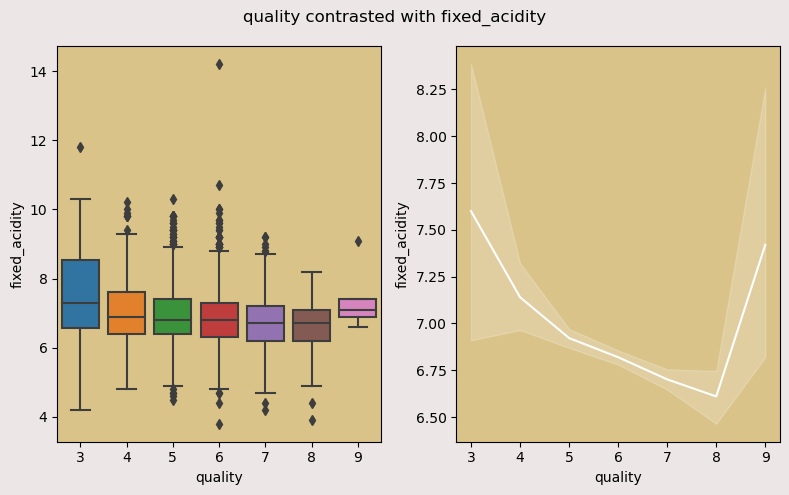

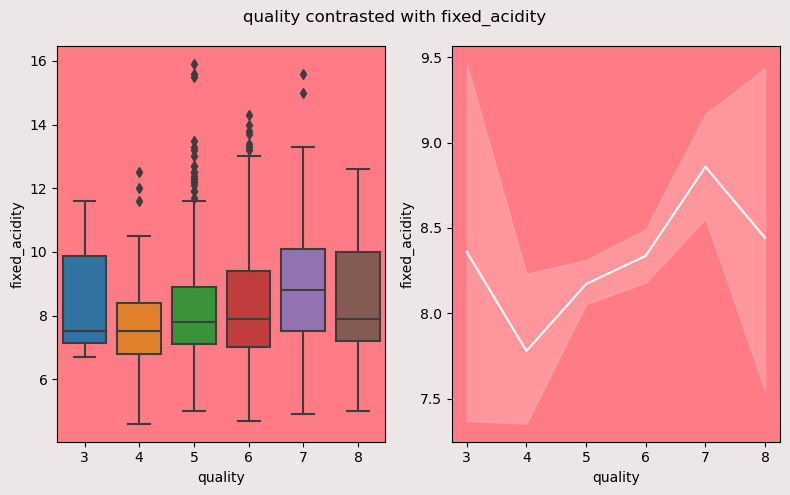

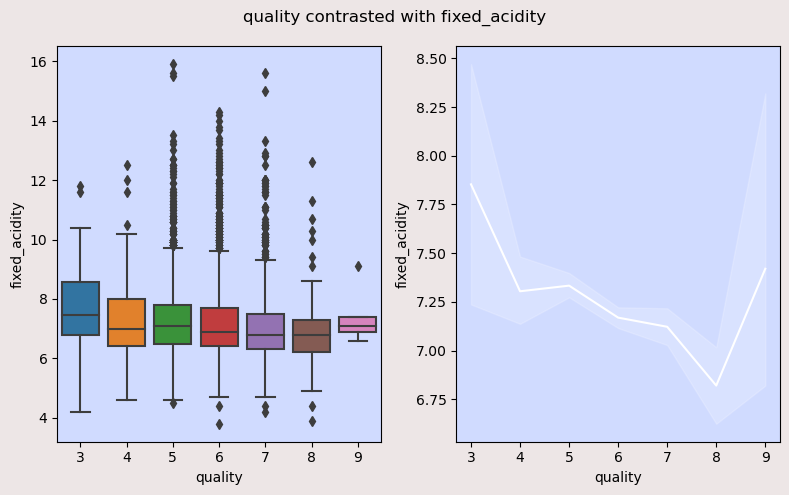

...

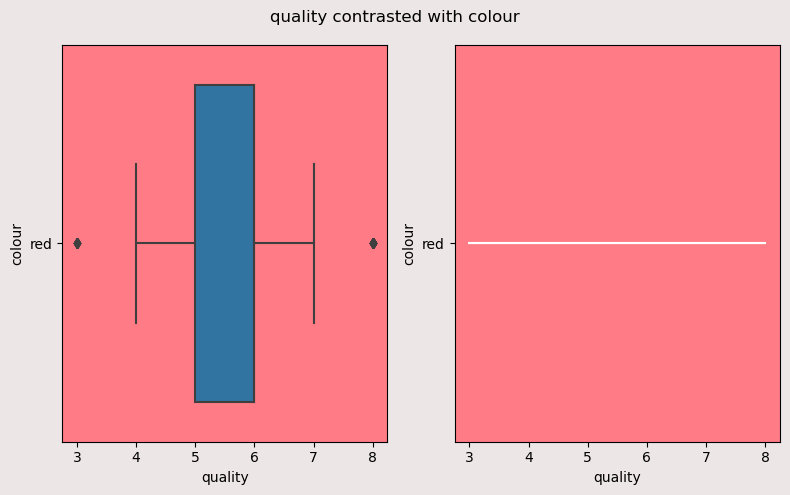

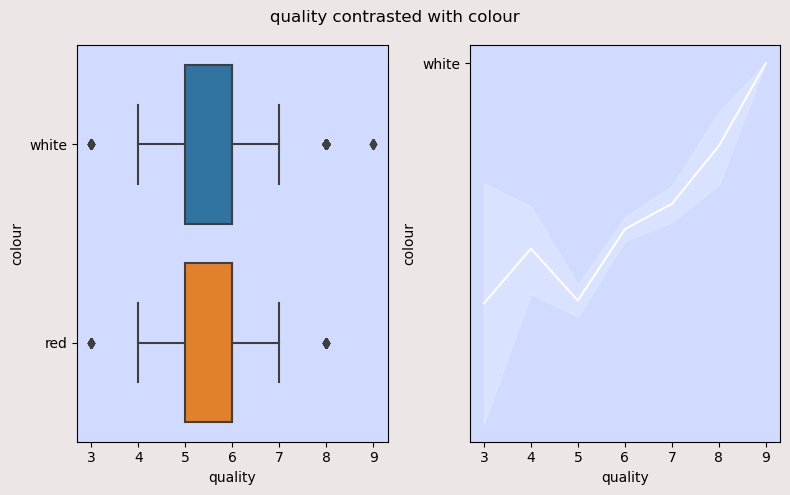

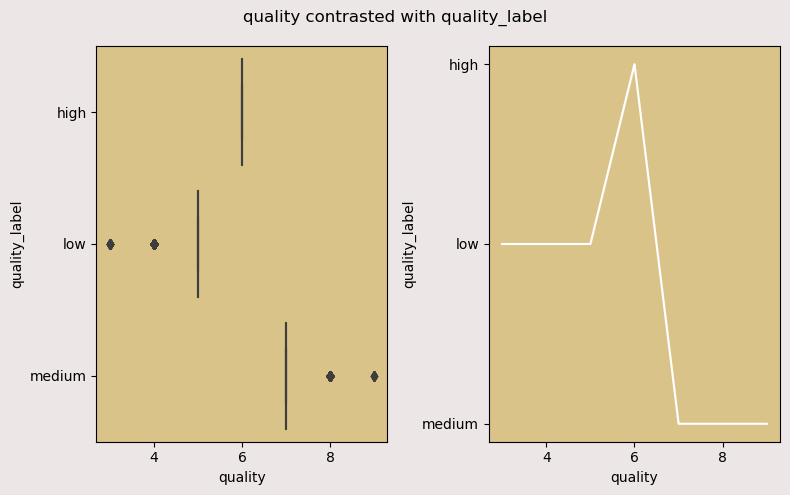

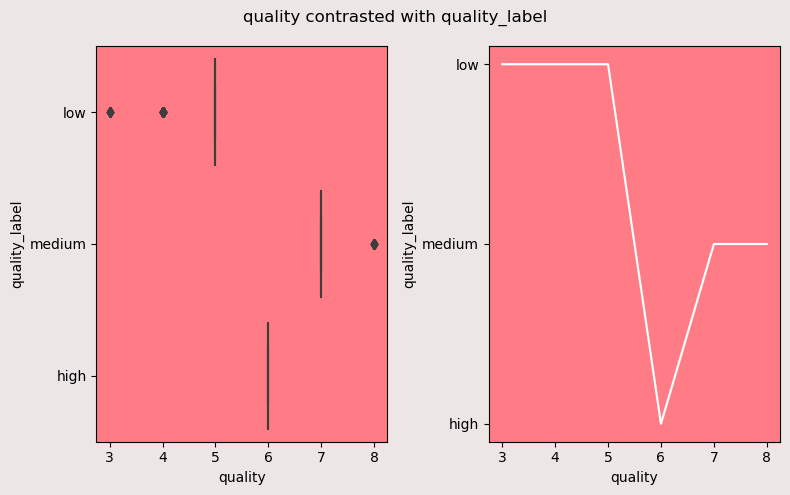

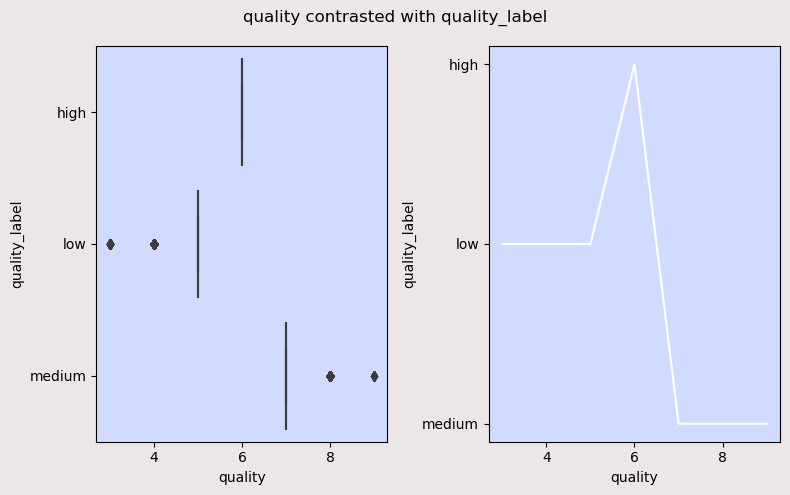

In [468]:
'''boxplot of variable contrasted with quality and also line plot of the same to be illustrative of 'group' variations'''

def boxplot_generator4(df_column1, df_column2, df):
    fig, axs = plt.subplots(1, 2, figsize=(8, 5))
    if df.equals(white_copy):
        color = white_color
    elif df.equals(red_copy):
        color = red_color
    else:
        color = all_wine_color
    fig.suptitle(f'{df_column1} contrasted with {df_column2}')
    #fig1.set_facecolor('#ea6e6e')
    fig.set_facecolor(background_grey)

    fig1 = sns.boxplot(x= df[df_column1], y= df[df_column2], ax = axs[0])
    axs[0].set_facecolor(color)
    axs[1].set_facecolor(color)
    fig2 = sns.lineplot(x = df[df_column1], y = df[df_column2], ax = axs[1], color = 'white', estimator= 'mean')
    plt.tight_layout()
    plt.show()

boxplot_generator4('quality', 'total_sulfur_dioxide', red_copy)
boxplot_generator4('quality', 'sulphates', red_copy)
for val in red_copy.columns:
    boxplot_generator4('quality', val, white_copy)
    boxplot_generator4('quality', val, red_copy)
    boxplot_generator4('quality', val, white_red_df)

    #
    

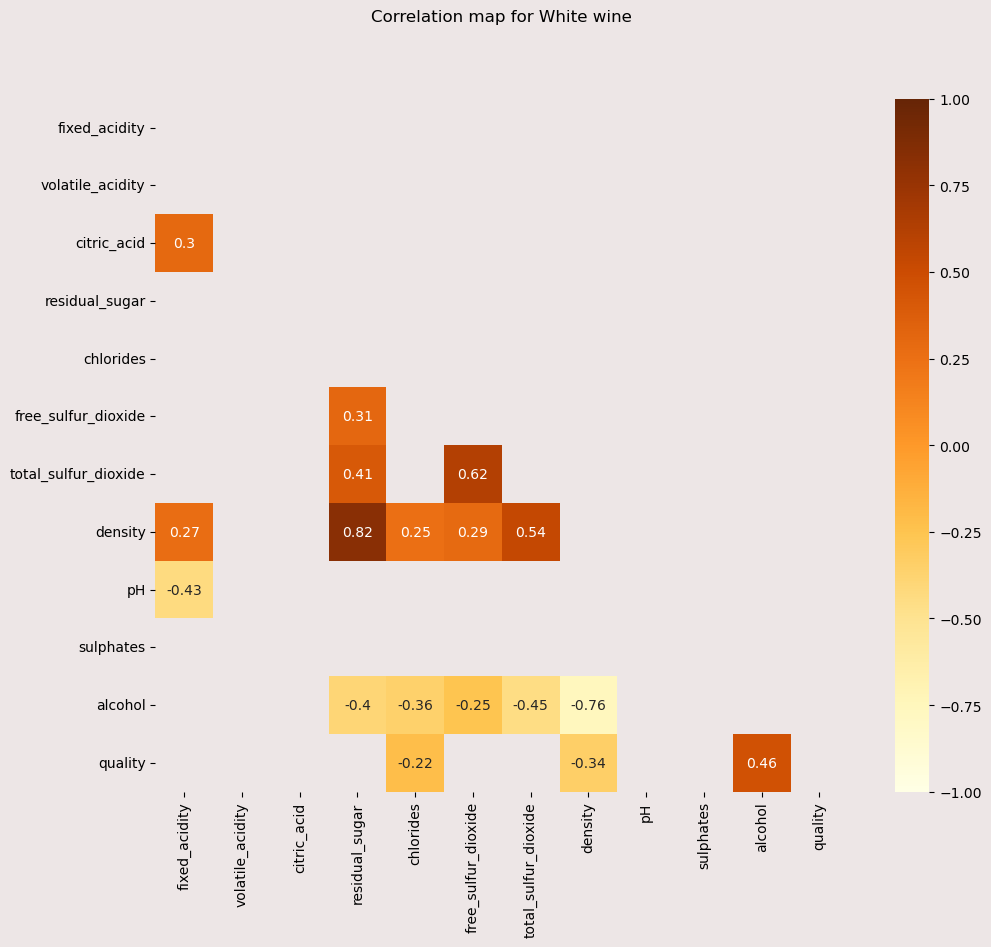

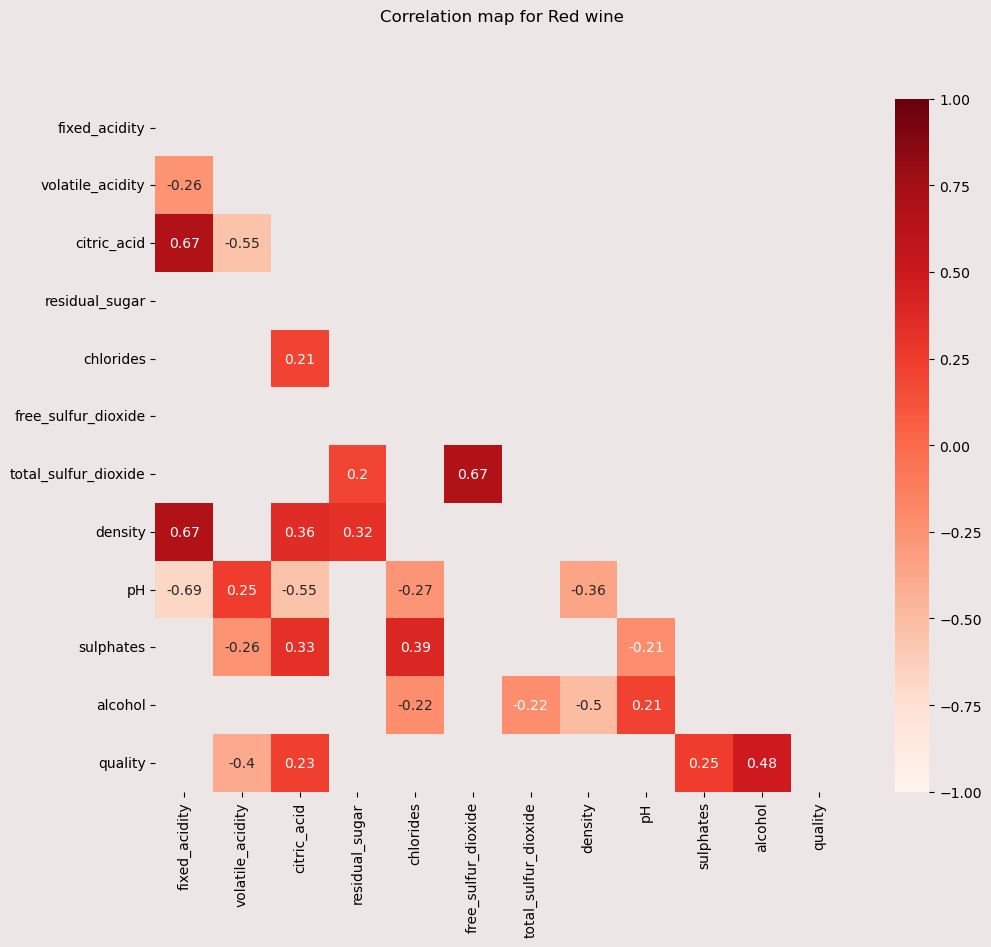

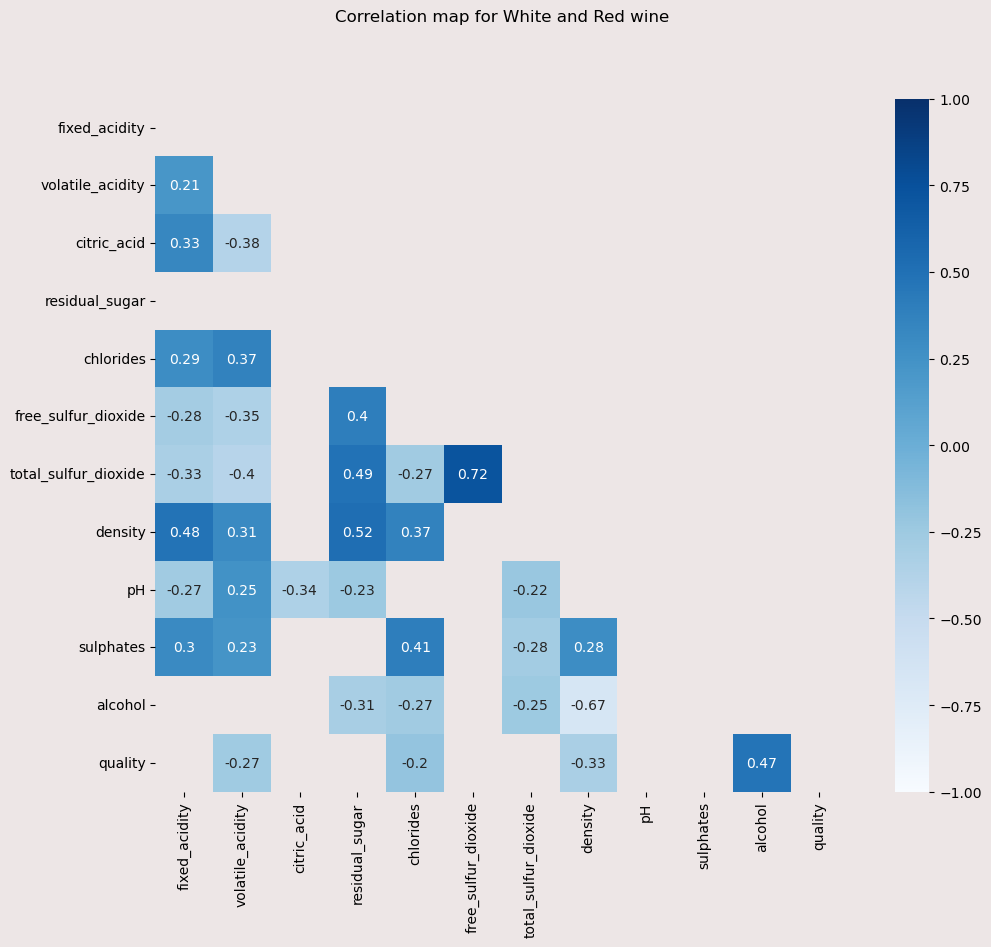

In [538]:
'''graphs to illustrate correlations between variables'''
def correlation_matrix(df):
    if df.equals(white_copy):
        col_scale = sns.color_palette("YlOrBr", as_cmap=True)
        color = white_color
        name = 'White wine'
    elif df.equals(red_copy):
        col_scale = sns.color_palette("Reds", as_cmap=True)
        name = 'Red wine'
        color = red_color
    else:
        col_scale = sns.color_palette("Blues", as_cmap=True)
        name = 'White and Red wine'
        color = all_wine_color
    
    
    fig, axs = plt.subplots(1,1, figsize= (12,9))
    fig.set_facecolor(background_grey)
    axs.set_facecolor(background_grey)
    #plt.subplots_adjust(top=1.15)  # You can adjust the value according to your needs
    
    plt.title(f'Correlation map for {name}', y=1.1)
    corr = df.iloc[:, :-2].corr()
   
    threshold  = 0.2
    mask = (np.abs(corr) < threshold) | np.triu(np.ones_like(corr), k=0)
    
    ax = sns.heatmap(corr, vmin = -1, vmax=1, center=0, square = True, annot= True, cmap = col_scale, mask=mask)

correlation_matrix(white_copy)
correlation_matrix(red_copy)
correlation_matrix(white_red_df)

In [470]:
from scipy import stats

def foneway_eval(df, depen_var, wine_type):

    F, p = stats.f_oneway(df[df['quality_label'] == 'low'][depen_var],
    df[df['quality_label'] == 'medium'][depen_var],
    df[df['quality_label'] == 'high'][depen_var])
    if p < 0.5:
        print(f'Reject the Null hypothesis. {depen_var} causes statisifically different groups for {wine_type}s')
    else:
        print('shite')
    print(F, p)
for val in col_lst:
    foneway_eval(white_copy, val, 'white wine')
for val in col_lst:
   foneway_eval(red_copy, val, 'red wine')
for val in col_lst:
    foneway_eval(white_red_df, val, 'both White & Red')

Reject the Null hypothesis. fixed_acidity causes statisifically different groups for white wines
25.185054135721053 1.3529528879156663e-11
Reject the Null hypothesis. volatile_acidity causes statisifically different groups for white wines
105.48751747985688 2.326025294786984e-45
Reject the Null hypothesis. citric_acid causes statisifically different groups for white wines
1.8631358774713656 0.15532130068589217
Reject the Null hypothesis. residual_sugar causes statisifically different groups for white wines
46.69989395917361 8.996906825773454e-21
Reject the Null hypothesis. chlorides causes statisifically different groups for white wines
111.49962344023895 7.785587437799092e-48
Reject the Null hypothesis. free_sulfur_dioxide causes statisifically different groups for white wines
1.353409242244501 0.2584774908842338
Reject the Null hypothesis. total_sulfur_dioxide causes statisifically different groups for white wines
93.71212549335216 1.7201620533001177e-40
Reject the Null hypothesis. d

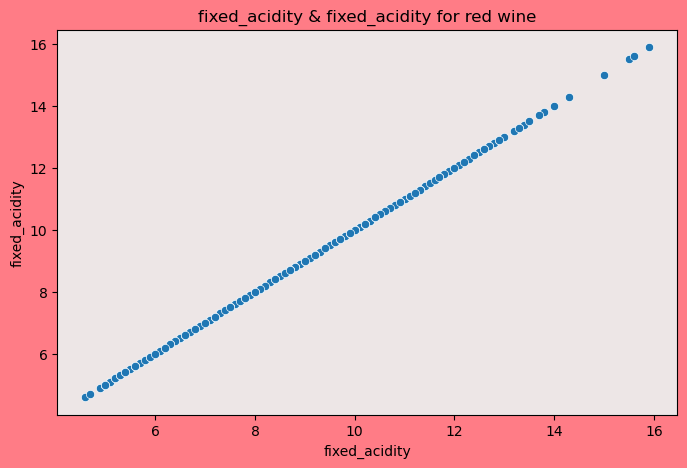

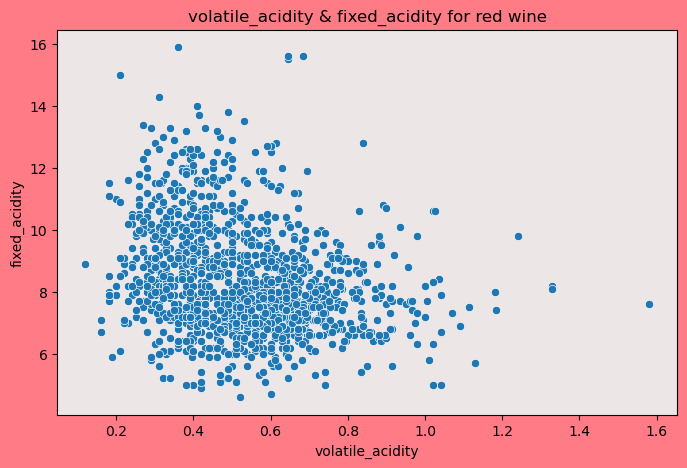

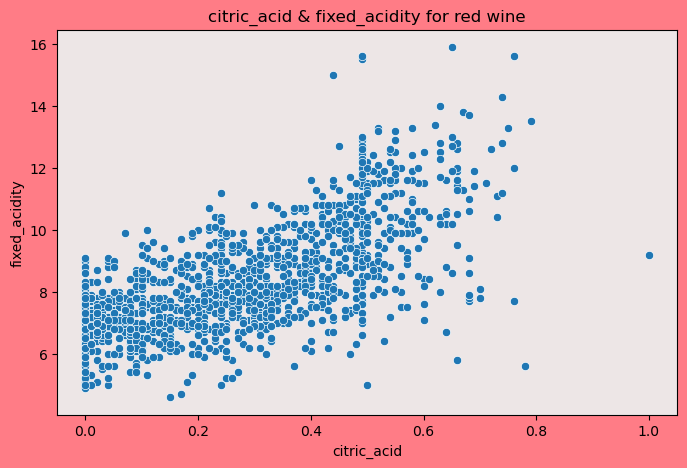

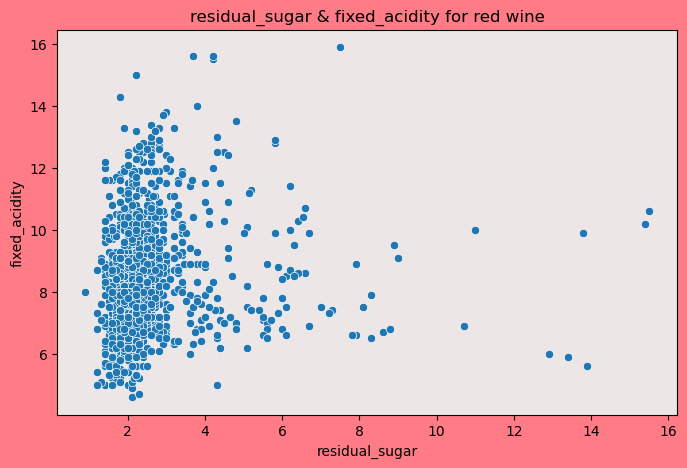

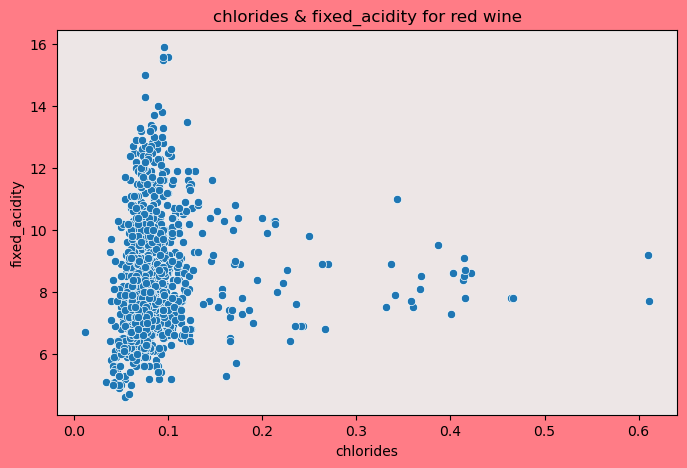

...

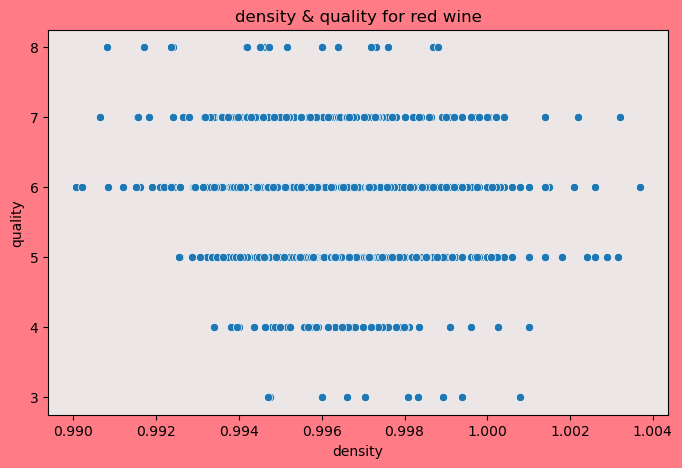

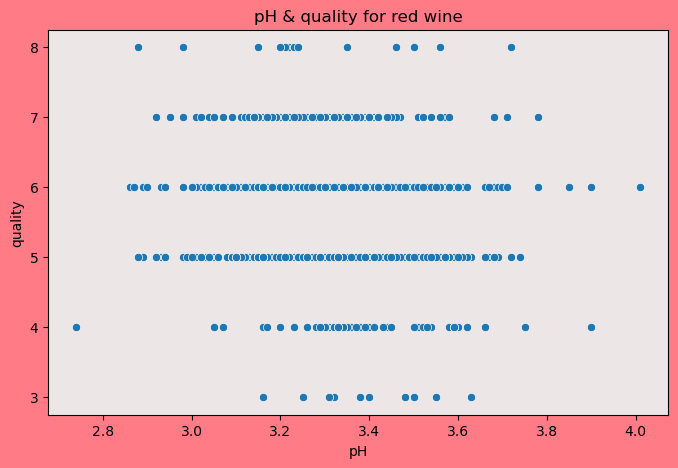

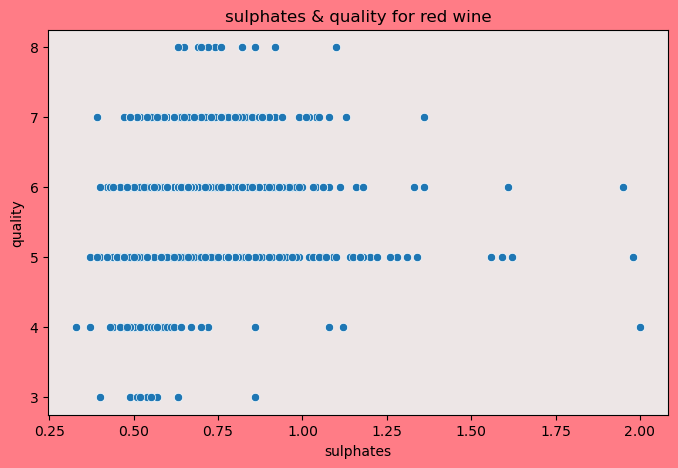

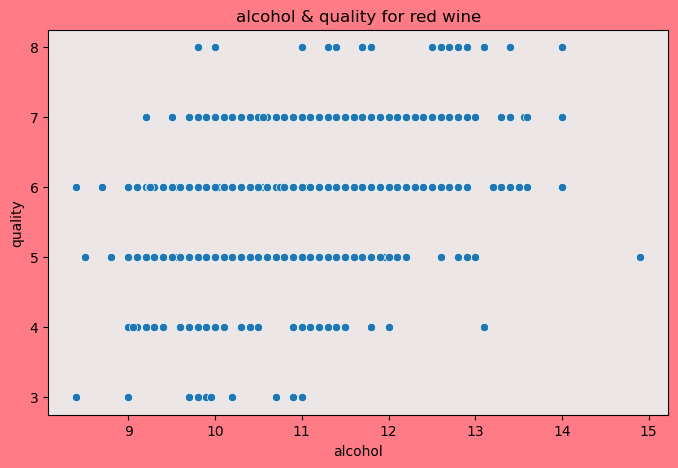

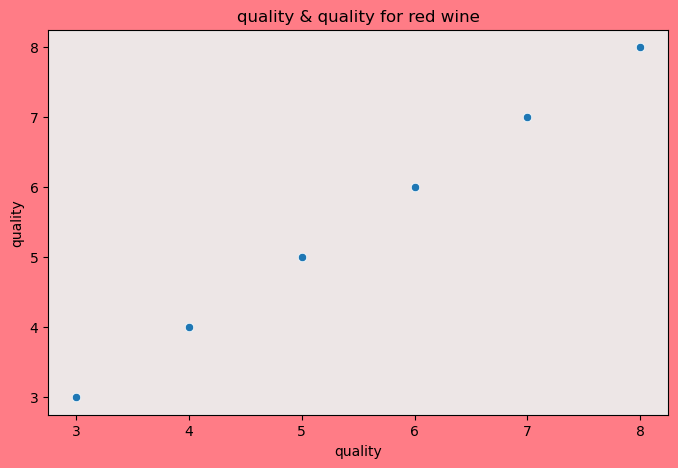

In [471]:
'''create scatterplots for 2 variables hued according to quality_label i.e pH & density'''
def scatterplot_2variables(x, y, df, wine_type):
    fig, axs = plt.subplots(1, 1, figsize=(8, 5))

    if df.equals(white_copy):
        color = white_color
    elif df.equals(red_copy):
        color = red_color
    else:
        color = all_wine_color
    fig.set_facecolor(color)
    #axs.set_facecolor(color)
   


    #axs = sns.scatterplot(x =x, y= y, data = df, hue = 'quality_label')
    axs = sns.scatterplot(x =x, y= y, data = df)

    axs.set_facecolor(background_grey)
    plt.title(f'{x} & {y} for {wine_type} wine')
    plt.show()
for val in col_lst:
    for val2 in col_lst:
        scatterplot_2variables(val2, val, red_copy, 'red')


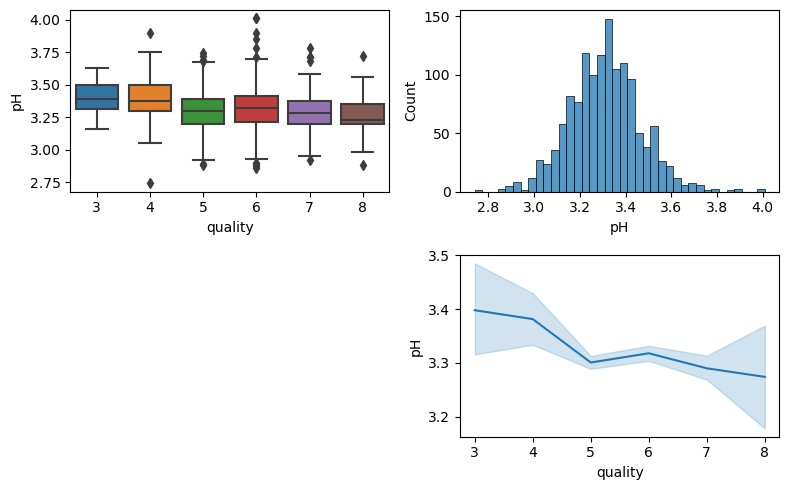

In [472]:
'''I want a graph wihta  box plot in both [0,0] & [1,0]. And then a histplot at [0,1] and a line plot at [1,1]'''

def combined_plot(df, wine_type, variable):
    fig, axs = plt.subplots(2, 2, figsize=(8, 5))
    if df.equals(white_copy):
        color = white_color
    elif df.equals(red_copy):
        color = red_color
    else:
        color = all_wine_color
    fig0 = sns.boxplot(x = 'quality', y = variable, data = df, ax = axs[0,0])
    fig1 = sns.histplot(df[variable], ax = axs[0,1])
    fig2 = sns.lineplot(x = 'quality', y = variable, data = df, ax = axs[1,1])
    fig.delaxes(axs[1, 0])
    plt.tight_layout()
    plt.show()

combined_plot(red_copy, 'red', 'pH')
    

In [473]:
def combined_plot2(df, wine_type, variable):
    fig = plt.figure(figsize=(10, 8))
    gs = gridspec.GridSpec(2, 2, height_ratios=[2, 1])
    if df.equals(white_copy):
        color = white_color
    elif df.equals(red_copy):
        color = red_color
    else:
        color = all_wine_color
    ax1 = plt.subplot(gs)
    fig0 = sns.boxplot(x = 'quality', y = variable, data = df, ax = axs[0,0])
    fig1 = sns.histplot(df[variable], ax = axs[0,1])
    fig2 = sns.lineplot(x = 'quality', y = variable, data = df, ax = axs[1,1])
    fig.delaxes(axs[1, 0])
    plt.tight_layout()
    plt.show()

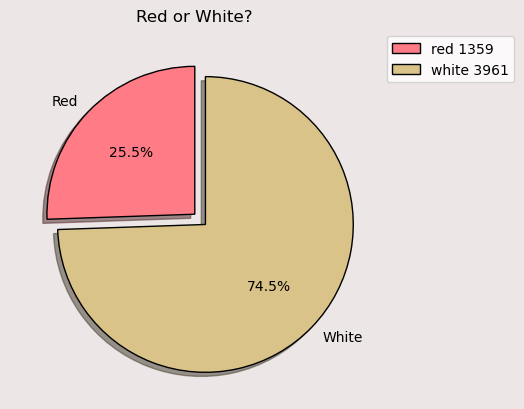

In [474]:
fig, ax = plt.subplots()
sizes = [len(red_copy), len(white_copy)]
colours = [red_color, white_color]
explode = (0, 0.1)
ax.pie(sizes, labels=['Red', 'White'], autopct='%1.1f%%', startangle=90, wedgeprops=dict(edgecolor='black'), shadow=True, colors = colours, explode = explode)
fig.patch.set_facecolor(background_grey)
plt.legend([f'red {len(red_copy)}', f'white {len(white_copy)}'], loc='upper left', bbox_to_anchor=(1, 1))

plt.title('Red or White?')
plt.show()

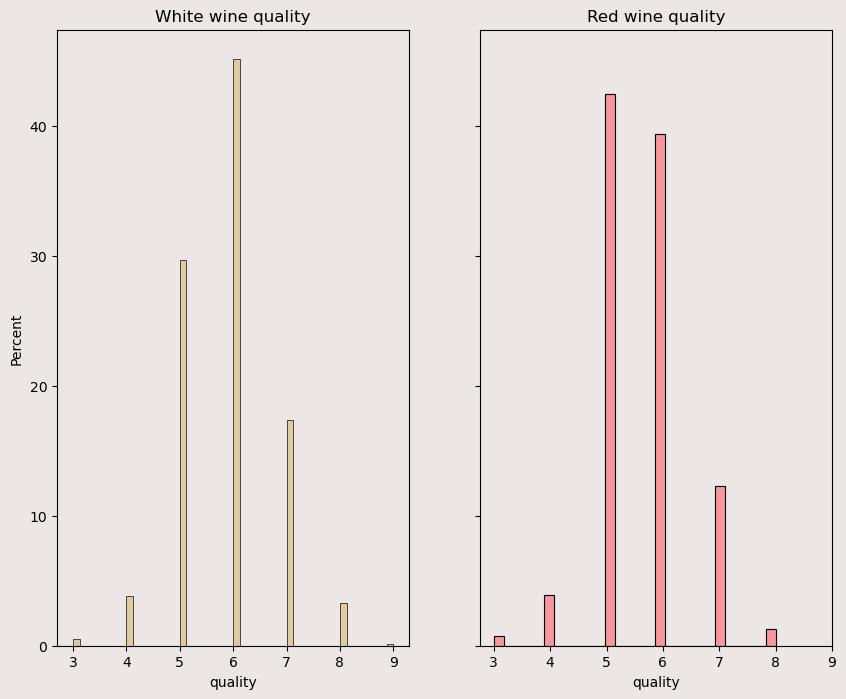

In [475]:
fig, axs= plt.subplots(1,2, figsize=(10, 8), sharey = True)
fig0= sns.histplot(x = white_copy.quality, ax = axs[0], color = white_color,bins = 'auto', stat = 'percent')
fig0.set_title('White wine quality')
fig1 = sns.histplot(x = red_copy.quality, ax = axs[1], color = red_color, bins = 'auto', stat = 'percent')
fig1.set_title('Red wine quality')
existing_ticks = fig0.get_xticks()
fig0.set_xticks(custom_ticks)
fig1.set_xticks(custom_ticks)
fig.patch.set_facecolor(background_grey)
fig0.patch.set_facecolor(background_grey)
fig1.patch.set_facecolor(background_grey)


plt.show()

#  fig, axs = plt.subplots(2, 2, figsize=(8, 5))
# 
#     fig0 = sns.boxplot(x = 'quality', y = variable, data = df, ax = axs[0,0])
#     fig1 = sns.histplot(df[variable], ax = axs[0,1])
#     fig2 = sns.lineplot(x = 'quality', y = variable, data = df, ax = axs[1,1])
#     fig.delaxes(axs[1, 0])
#     plt.tight_layout()
#     plt.show()


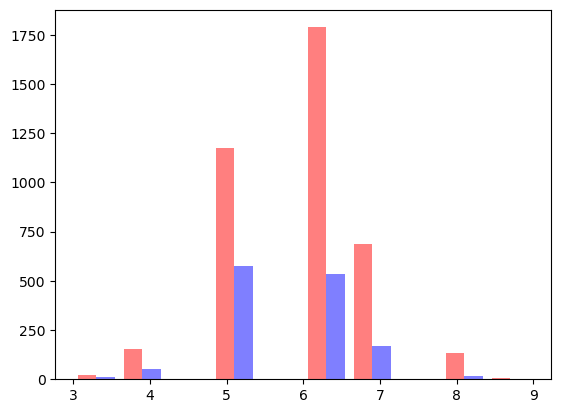

In [476]:
plt.hist([white_copy.quality, red_copy.quality], color=['r','b'], alpha=0.5)
plt.show()


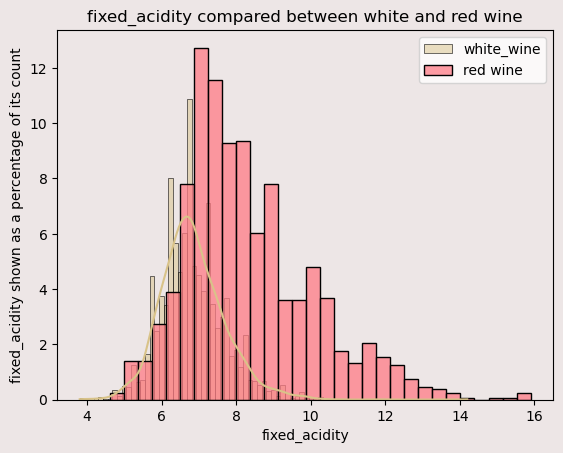

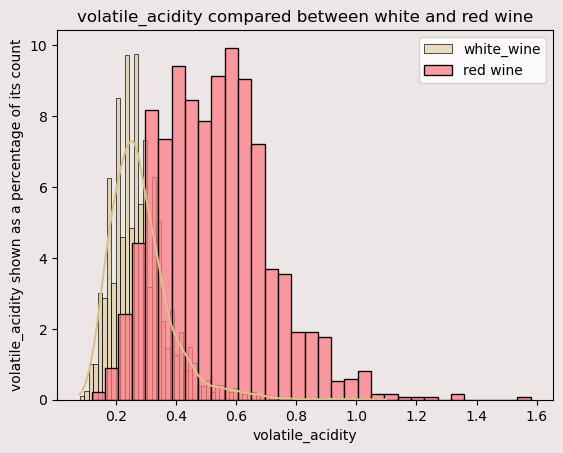

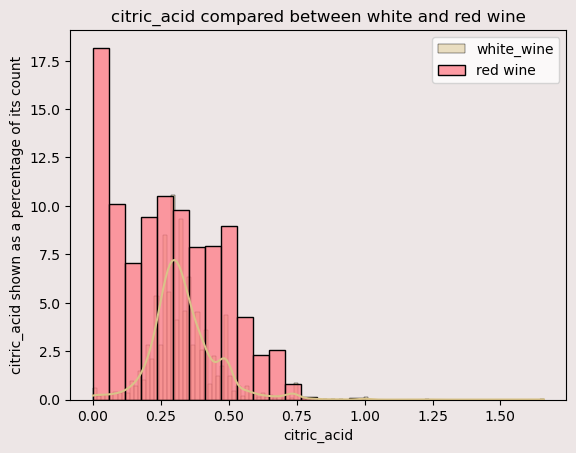

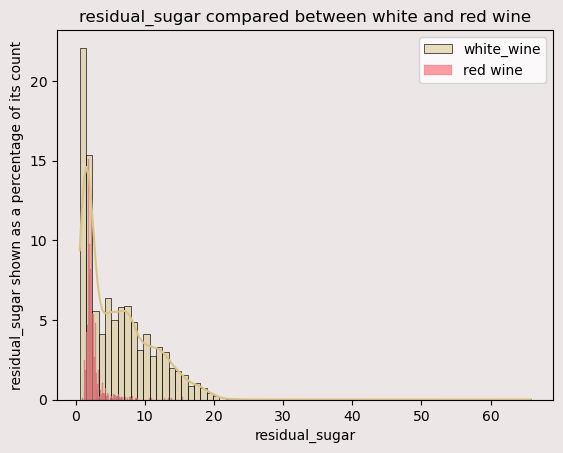

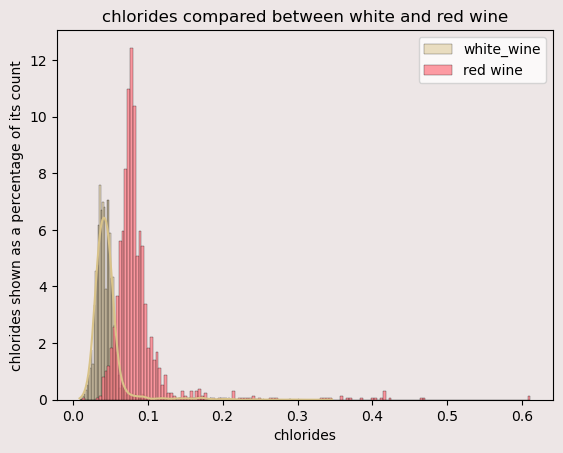

...

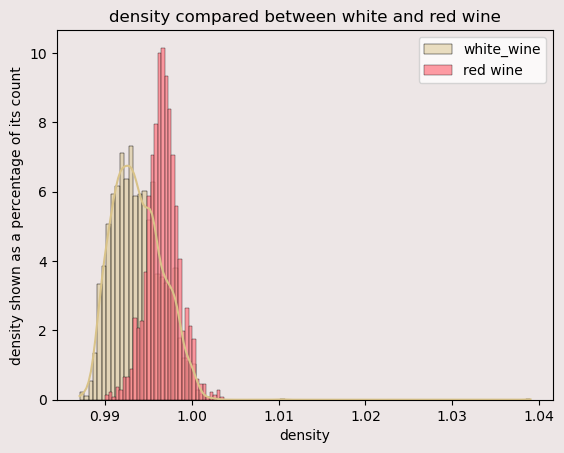

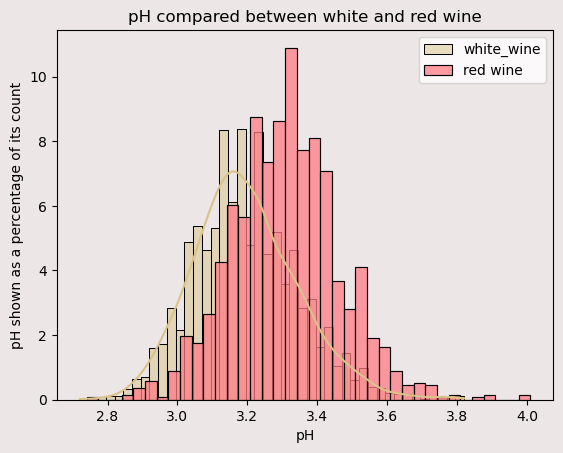

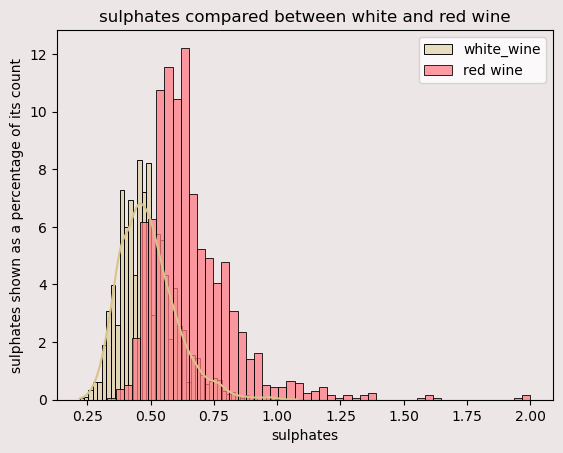

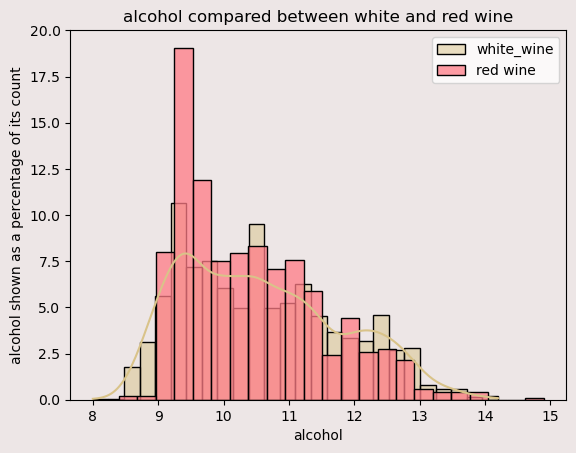

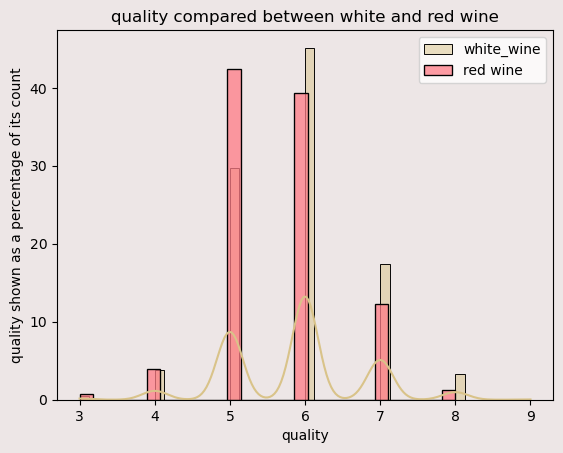

In [477]:
def dist_plot_overlay(column_name):
    #plt.ylabel('Frequency - normalised')
    fig1, ax = plt.subplots()

    ax = sns.histplot(white_copy[column_name], kde =True,  color=white_color, stat= 'percent', label = 'white_wine')
    fig1.set_facecolor(background_grey)
    ax.set_facecolor(background_grey)
    ax.set_title(f'{column_name} compared between white and red wine')
    ax.set_ylabel(f'{column_name} shown as a percentage of its count')

    fig2 = sns.histplot(red_copy[column_name], kde = False,  color = red_color, stat= 'percent', label = 'red wine')
    plt.legend()
    plt.show()
for val in col_lst:
    dist_plot_overlay(val)

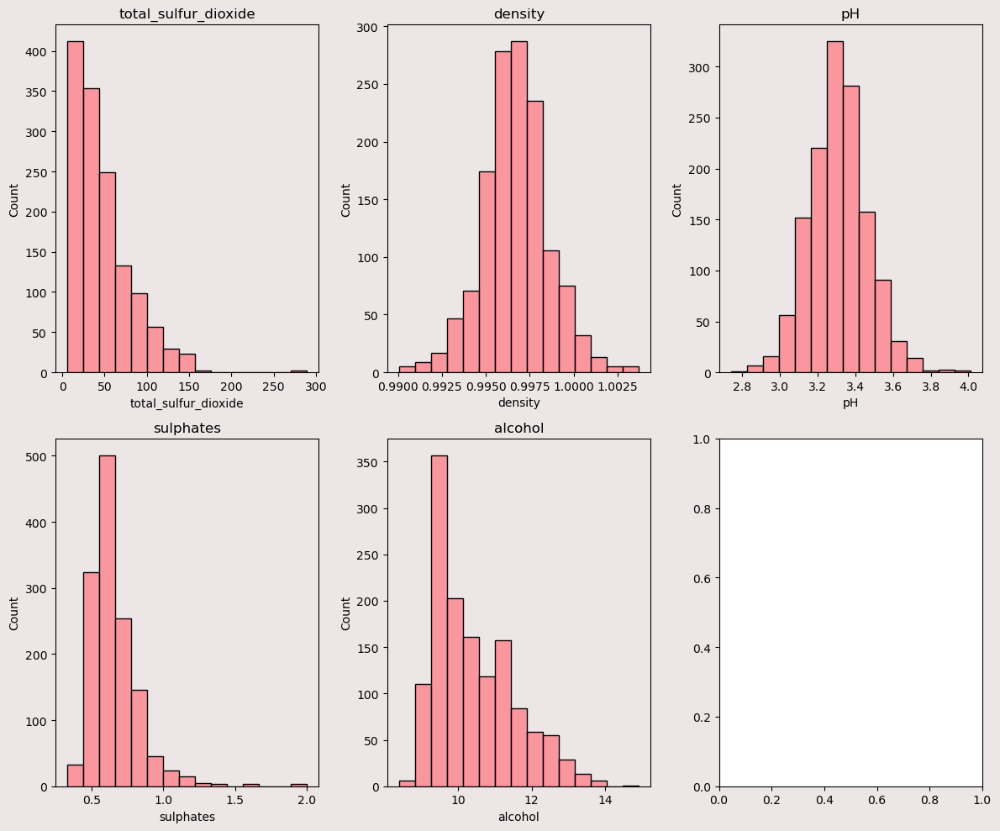

In [478]:
def histplot_generator(lst_cols, colour):
    num_cols = len(lst_cols)
    if colour == 'red':
        colour = red_color
        df = red_copy
    elif colour == 'white':
        colour = white_color
        df = white_copy
    else:
        colour = all_wine_color
        df = white_red_df
    num_rows = (num_cols //3) + (num_cols %2)
    fig, axs = plt.subplots(num_rows, 3, figsize = (12, 5 *num_rows))
    fig.set_facecolor(background_grey)
    axs = axs.flatten()
    for i, var_of_i in enumerate(lst_cols):
        ax = axs[i]
        sns.histplot(x = df[var_of_i],bins = 15, ax = ax, color = colour)
        
        ax.set_facecolor(background_grey)
        ax.set_title(f'{var_of_i}')   
    plt.tight_layout()
    #background_grey = '#ede6e6'

histplot_generator(col_lst[6:-1], 'red')


In [479]:
for val in col_lst:
    print(f'{val} kurotisis is {kurtosis(white_copy[val], fisher = False)}')

fixed_acidity kurotisis is 5.248689977324453
volatile_acidity kurotisis is 8.319516726521591
citric_acid kurotisis is 9.83465658444057
residual_sugar kurotisis is 8.672828498153047
chlorides kurotisis is 38.48393929729571
free_sulfur_dioxide kurotisis is 16.415558609295317
total_sulfur_dioxide kurotisis is 3.732815680038323
density kurotisis is 17.165478351823488
pH kurotisis is 3.547748678678901
sulphates kurotisis is 4.561531376595966
alcohol kurotisis is 2.303384125261219
quality kurotisis is 3.2974530515266682


In [480]:
white_red_df.quality.median()

6.0

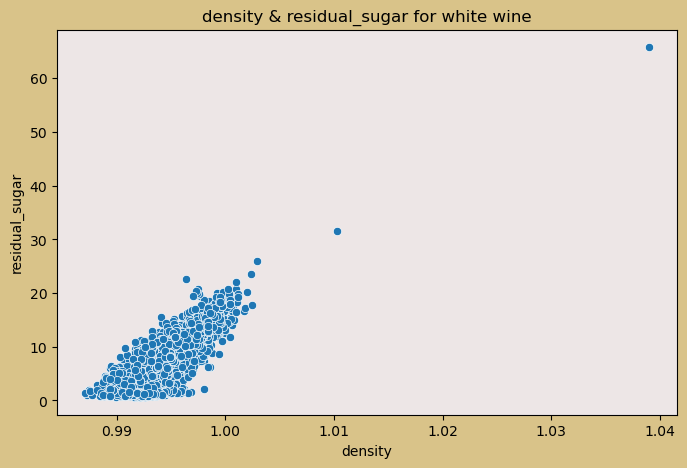

In [481]:
scatterplot_2variables('density', 'residual_sugar', white_copy, 'white')

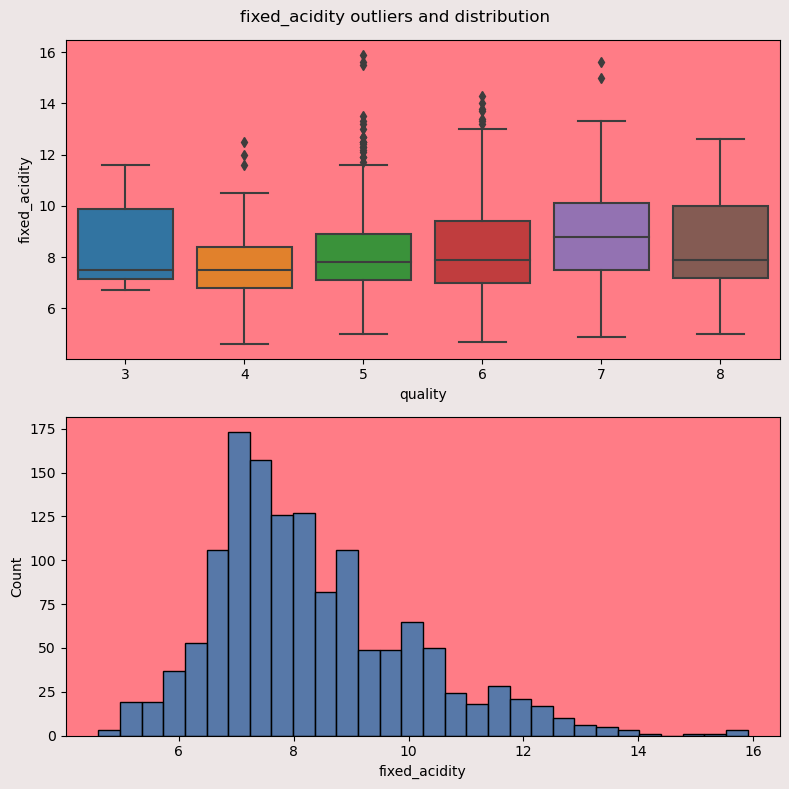

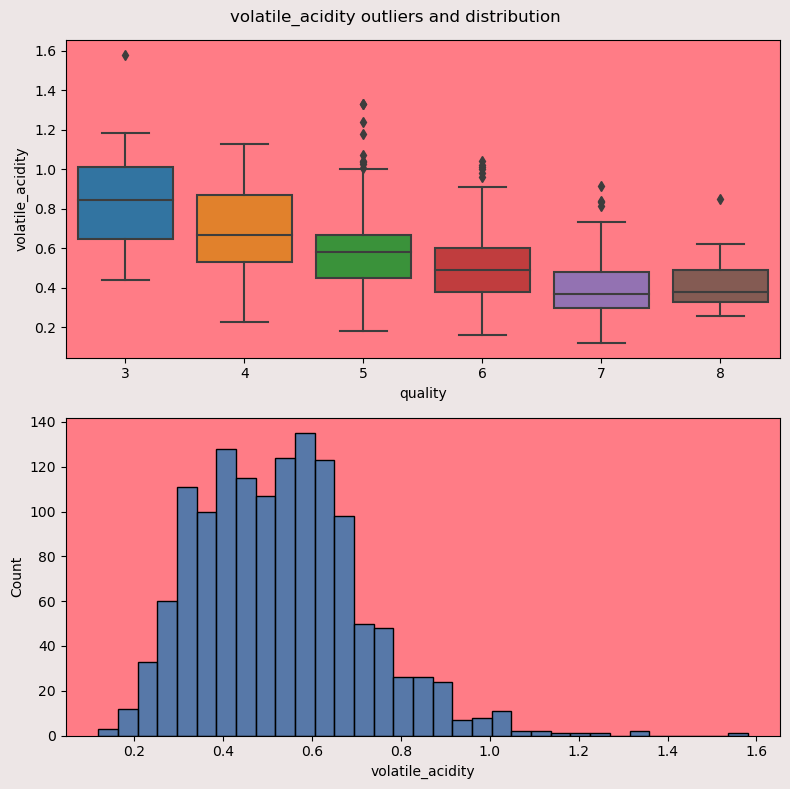

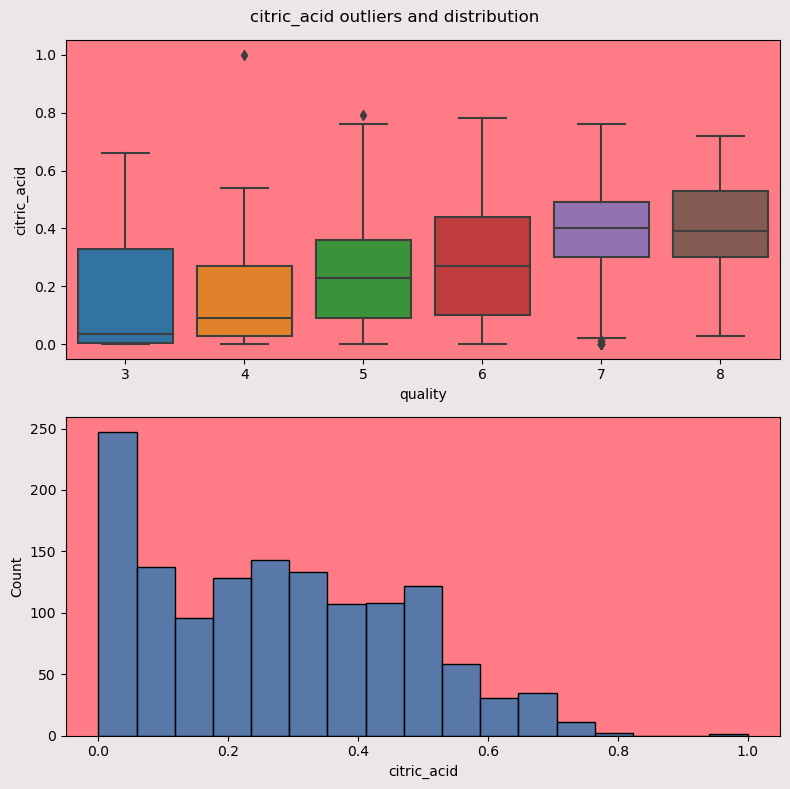

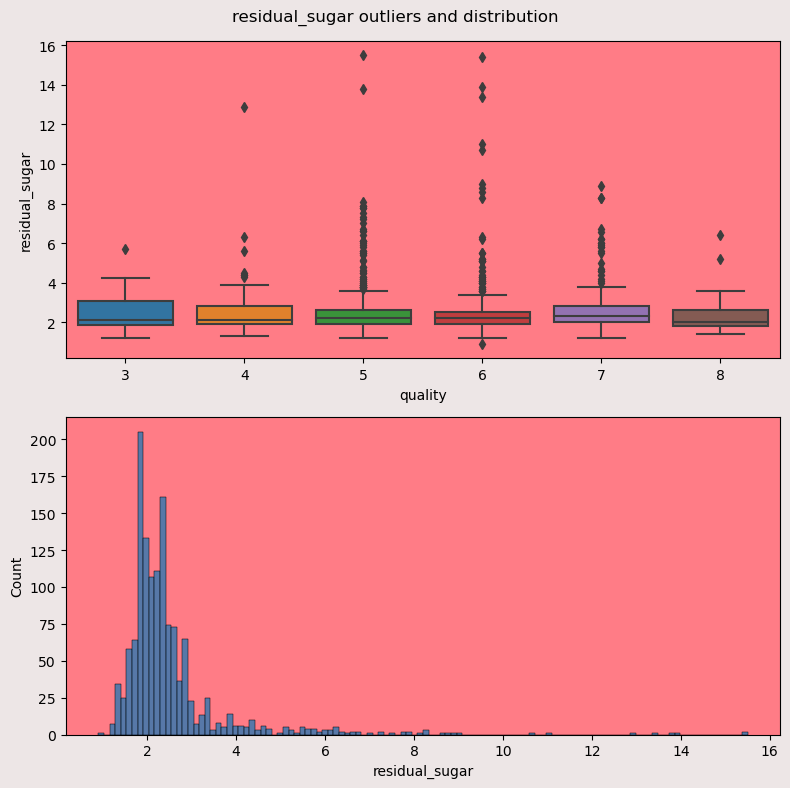

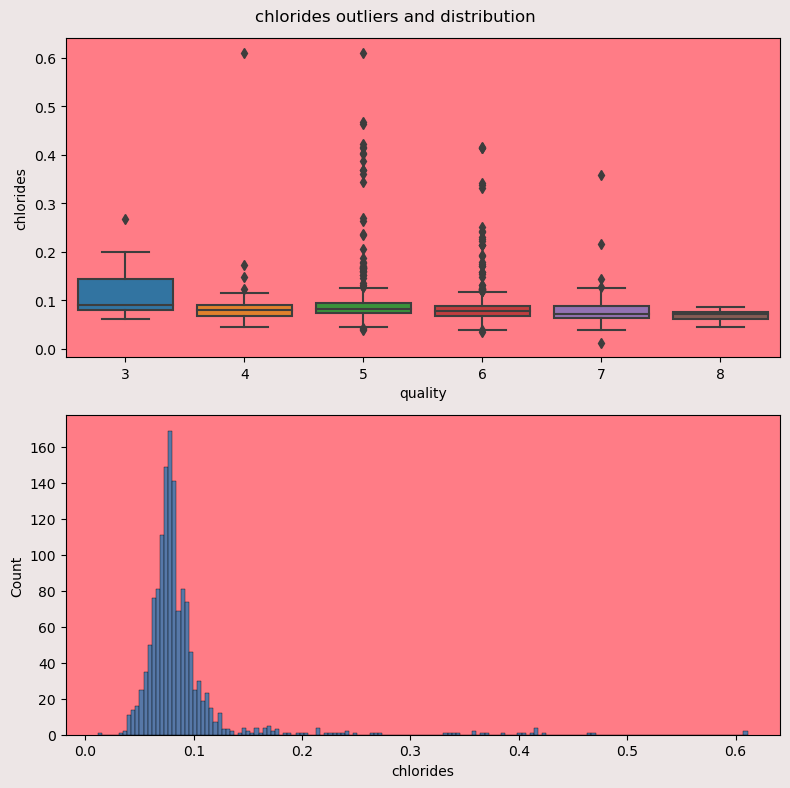

...

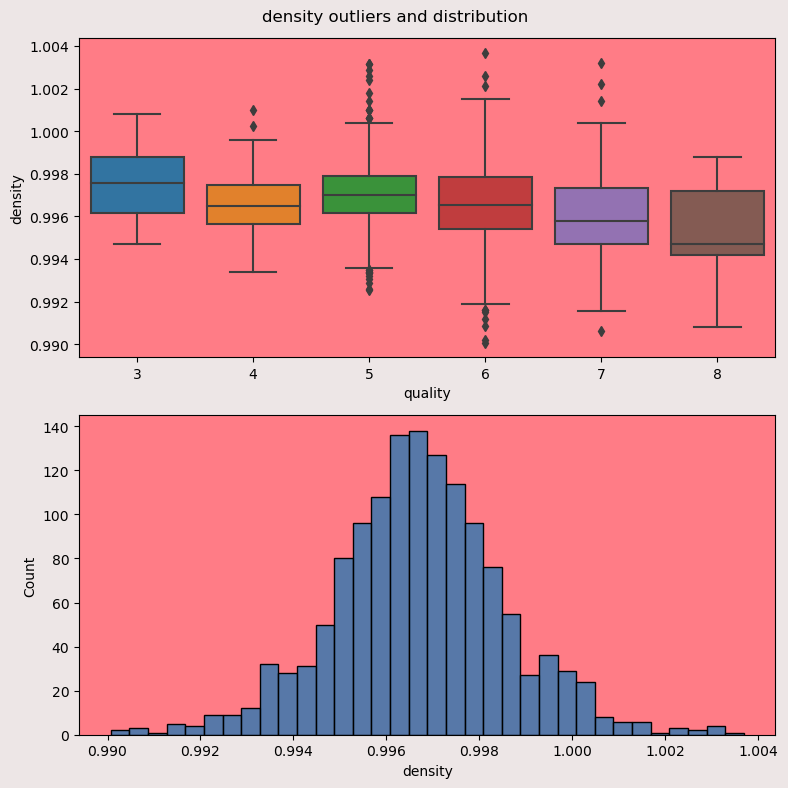

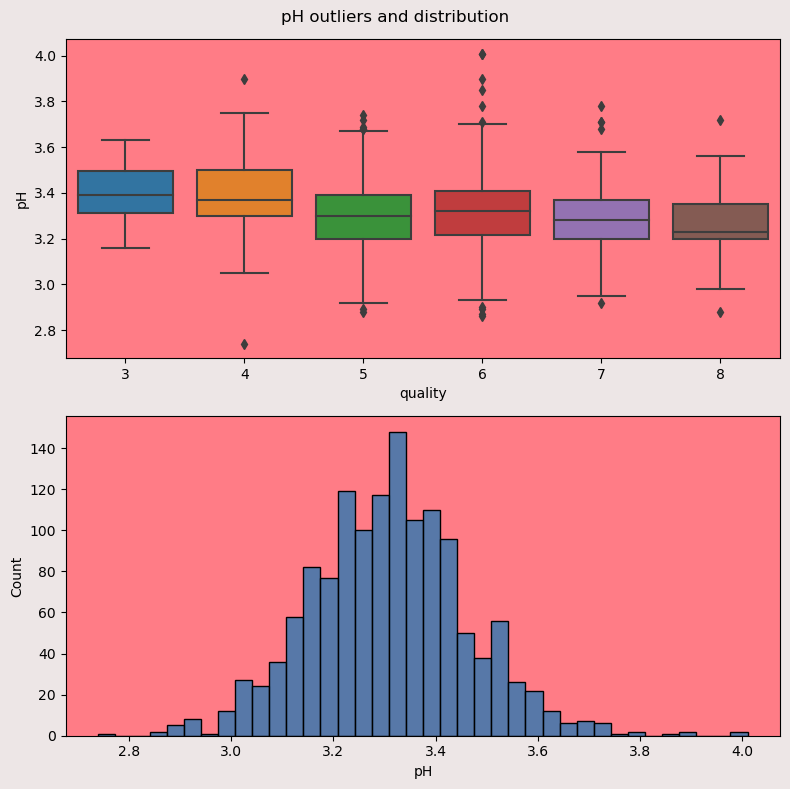

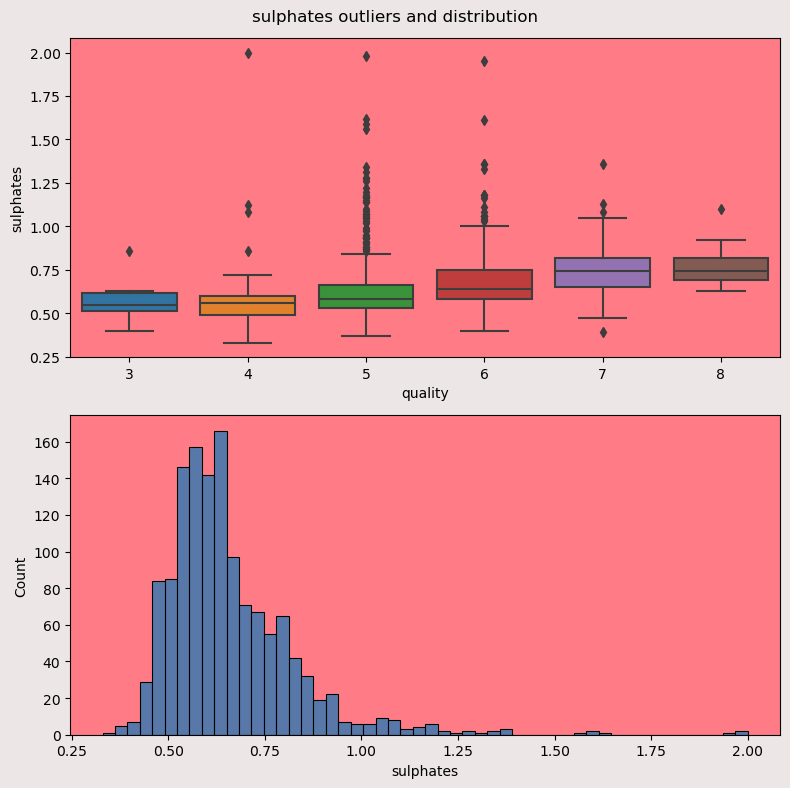

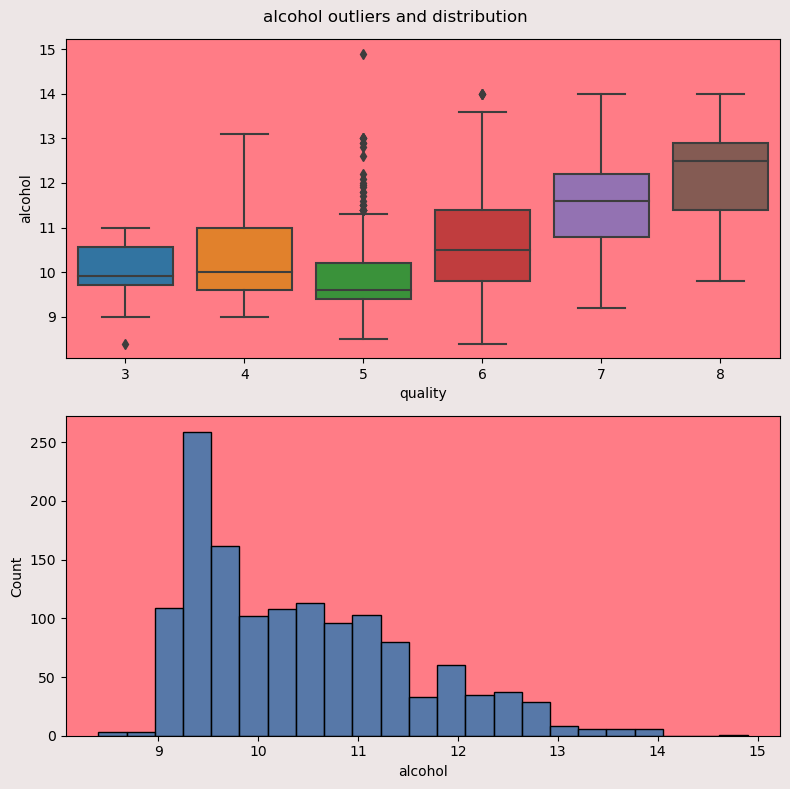

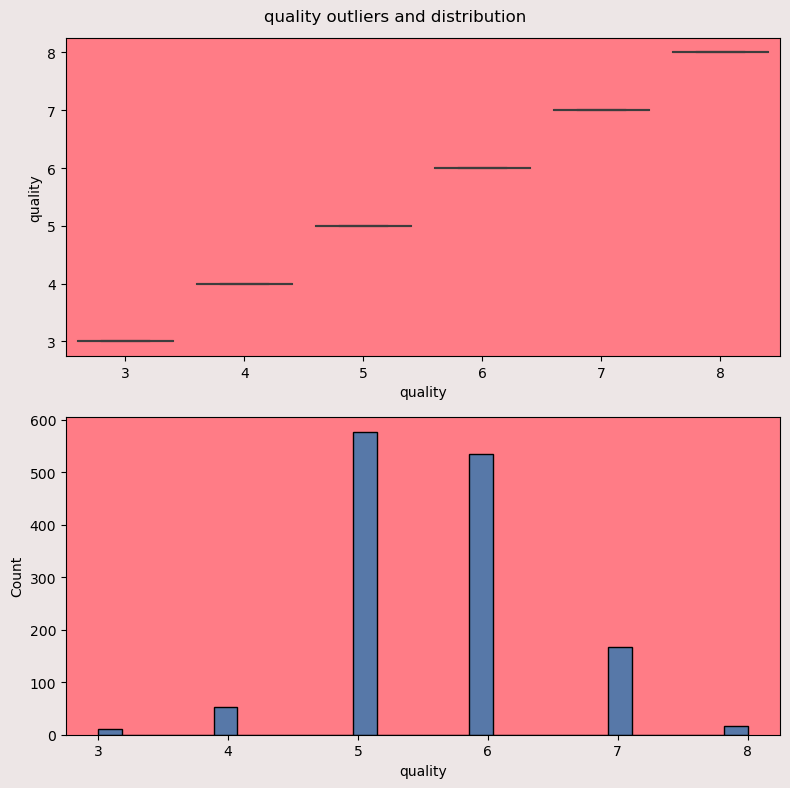

In [515]:
def boxplot_generator5(colour, variable1, variable2):
    if colour == 'red':
        colour = red_color
        df = red_copy
    elif colour == 'white':
        colour = white_color
        df = white_copy
    else:
        colour = all_wine_color
        df = white_red_df
    fig, axs = plt.subplots(2, 1, figsize=(8, 8))
    plt.suptitle(f'{variable2} outliers and distribution')
    sns.boxplot(x = df[variable1], y= df[variable2], ax = axs[0])
    sns.histplot(df[variable2], ax = axs[1])
    axs[0].set_facecolor(colour)
    axs[1].set_facecolor(colour)
    fig.set_facecolor(background_grey)
    plt.tight_layout()
    plt.show()

for val in col_lst:
    boxplot_generator5('red', 'quality', val)

# def boxplot_generator(df_column1, df_column2):
#     fig, axs = plt.subplots(1, 2, figsize=(8, 5), sharey= True)
#     fig1 = sns.boxplot(x= df_column1, y= df_column2, ax = axs[1])
#     fig2 = sns.boxplot(x= white_copy['quality'], y= df_column2, ax = axs[0])
#     axs[0].set_title('White wine')
#     axs[0].set_facecolor(white_color)
#     axs[1].set_title('Red wine')
#     plt.gca().set_facecolor(red_color)
    


In [522]:
def cv_calc(df_variable):
    mean = df_variable.mean()
    std = df_variable.std()
    cv = (std / mean) * 100
    print(df_variable.name)
    print(f"Mean: {mean}")
    print(f"Standard Deviation: {std}")
    print(f"Coefficient of Variation (CV): {cv:.2f}%")
    print('___________')
    
for val in col_lst:
    cv_calc(red_copy[val])        

fixed_acidity
Mean: 8.310596026490067
Standard Deviation: 1.736989807532466
Coefficient of Variation (CV): 20.90%
___________
volatile_acidity
Mean: 0.5294775570272259
Standard Deviation: 0.18303131761907185
Coefficient of Variation (CV): 34.57%
___________
citric_acid
Mean: 0.2723325974981604
Standard Deviation: 0.1955365445504639
Coefficient of Variation (CV): 71.80%
___________
residual_sugar
Mean: 2.5233995584988964
Standard Deviation: 1.3523137577104198
Coefficient of Variation (CV): 53.59%
___________
chlorides
Mean: 0.08812362030905077
Standard Deviation: 0.04937686244348626
Coefficient of Variation (CV): 56.03%
___________
free_sulfur_dioxide
Mean: 15.893303899926417
Standard Deviation: 10.447270259048693
Coefficient of Variation (CV): 65.73%
___________
total_sulfur_dioxide
Mean: 46.82597498160412
Standard Deviation: 33.40894570661654
Coefficient of Variation (CV): 71.35%
___________
density
Mean: 0.9967089477557026
Standard Deviation: 0.0018689171325591398
Coefficient of Vari

In [552]:
import plotly.express as px
for val in col_lst:
    fig= px.scatter_3d(data_frame = red_copy, x='quality', y= 'alcohol', z= val, color = 'quality')
    fig.show()
